# Unsupervised Learning: Trade & Ahead

## Problem Statement

### Context

The stock market has consistently proven to be a good place to invest in and save for the future. There are a lot of compelling reasons to invest in stocks. It can help in fighting inflation, create wealth, and also provides some tax benefits. Good steady returns on investments over a long period of time can also grow a lot more than seems possible. Also, thanks to the power of compound interest, the earlier one starts investing, the larger the corpus one can have for retirement. Overall, investing in stocks can help meet life's financial aspirations.

It is important to maintain a diversified portfolio when investing in stocks in order to maximise earnings under any market condition. Having a diversified portfolio tends to yield higher returns and face lower risk by tempering potential losses when the market is down. It is often easy to get lost in a sea of financial metrics to analyze while determining the worth of a stock, and doing the same for a multitude of stocks to identify the right picks for an individual can be a tedious task. By doing a cluster analysis, one can identify stocks that exhibit similar characteristics and ones which exhibit minimum correlation. This will help investors better analyze stocks across different market segments and help protect against risks that could make the portfolio vulnerable to losses.


### Objective

Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies. They have hired you as a Data Scientist and provided you with data comprising stock price and some financial indicators for a few companies listed under the New York Stock Exchange. They have assigned you the tasks of analyzing the data, grouping the stocks based on the attributes provided, and sharing insights about the characteristics of each group.

### Data Dictionary

- Ticker Symbol: An abbreviation used to uniquely identify publicly traded shares of a particular stock on a particular stock market
- Company: Name of the company
- GICS Sector: The specific economic sector assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- GICS Sub Industry: The specific sub-industry group assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- Current Price: Current stock price in dollars
- Price Change: Percentage change in the stock price in 13 weeks
- Volatility: Standard deviation of the stock price over the past 13 weeks
- ROE: A measure of financial performance calculated by dividing net income by shareholders' equity (shareholders' equity is equal to a company's assets minus its debt)
- Cash Ratio: The ratio of a  company's total reserves of cash and cash equivalents to its total current liabilities
- Net Cash Flow: The difference between a company's cash inflows and outflows (in dollars)
- Net Income: Revenues minus expenses, interest, and taxes (in dollars)
- Earnings Per Share: Company's net profit divided by the number of common shares it has outstanding (in dollars)
- Estimated Shares Outstanding: Company's stock currently held by all its shareholders
- P/E Ratio: Ratio of the company's current stock price to the earnings per share
- P/B Ratio: Ratio of the company's stock price per share by its book value per share (book value of a company is the net difference between that company's total assets and total liabilities)

## Importing necessary libraries and data

In [1]:
# Installing the libraries with the specified version
# uncomment and run the following line if Google Colab is being used
!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 yellowbrick==1.5 -q --user

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 29.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pandas<2.2.2dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
google-colab 1.0.0 requires pandas==2.0.3, but you have pandas 1.5.3 which is incompatible.


**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [2]:
# this will help in making the Python code more structured automatically (good coding practice)
#%load_ext nb_black

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='darkgrid')

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

#to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# to perform PCA
from sklearn.decomposition import PCA

# to suppress warnings
import warnings
warnings.filterwarnings("ignore")

In [4]:
# running yellowbrick library if not previously installed
!pip install yellowbrick

# to suppress warnings
import warnings
warnings.filterwarnings("ignore")

In [5]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# import libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
#  To let colab access my google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
# To import and read the data
data=pd.read_csv('/content/drive/MyDrive/stock_data.csv')

## **Checking** the shape of the dataset


In [8]:
# checking shape of the data
data.shape

(340, 15)

The dataset has 340 rows with 15 variables

In [10]:
# To view a sample of the data
data.sample(n=10, random_state=1)

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
102,DVN,Devon Energy Corp.,Energy,Oil & Gas Exploration & Production,32.000000,-15.478079,2.923698,205,70,830000000,-14454000000,-35.55,4.065823e+08,93.089287,1.785616
125,FB,Facebook,Information Technology,Internet Software & Services,104.660004,16.224320,1.320606,8,958,592000000,3669000000,1.31,2.800763e+09,79.893133,5.884467
11,AIV,Apartment Investment & Mgmt,Real Estate,REITs,40.029999,7.578608,1.163334,15,47,21818000,248710000,1.52,1.636250e+08,26.335526,-1.269332
248,PG,Procter & Gamble,Consumer Staples,Personal Products,79.410004,10.660538,0.806056,17,129,160383000,636056000,3.28,4.913916e+08,24.070121,-2.256747
238,OXY,Occidental Petroleum,Energy,Oil & Gas Exploration & Production,67.610001,0.865287,1.589520,32,64,-588000000,-7829000000,-10.23,7.652981e+08,93.089287,3.345102
336,YUM,Yum! Brands Inc,Consumer Discretionary,Restaurants,52.516175,-8.698917,1.478877,142,27,159000000,1293000000,2.97,4.353535e+08,17.682214,-3.838260
112,EQT,EQT Corporation,Energy,Oil & Gas Exploration & Production,52.130001,-21.253771,2.364883,2,201,523803000,85171000,0.56,1.520911e+08,93.089287,9.567952
147,HAL,Halliburton Co.,Energy,Oil & Gas Equipment & Services,34.040001,-5.101751,1.966062,4,189,7786000000,-671000000,-0.79,8.493671e+08,93.089287,17.345857
89,DFS,Discover Financial Services,Financials,Consumer Finance,53.619999,3.653584,1.159897,20,99,2288000000,2297000000,5.14,4.468872e+08,10.431906,-0.375934
173,IVZ,Invesco Ltd.,Financials,Asset Management & Custody Banks,33.480000,7.067477,1.580839,12,67,412000000,968100000,2.26,4.283628e+08,14.814159,4.218620


The dataset has both numerical and object data

In [9]:
# creating a copy of data frame
data1 = data.copy()

A copy of the dataset, data1, has been created for manipulation

In [10]:
# replacing variable labels
data1.columns = [col.replace(' ','_').lower() for col in data1.columns]

The variable labels of the dataset have been replaced

In [11]:
# checking the last 5 rows of the dataframe
data1.tail()

,ticker_symbol,security,gics_sector,gics_sub_industry,current_price,price_change,volatility,roe,cash_ratio,net_cash_flow,net_income,earnings_per_share,estimated_shares_outstanding,p/e_ratio,p/b_ratio
335,YHOO,Yahoo Inc.,Information Technology,Internet Software & Services,33.259998,14.887727,1.845149,15,459,-1032187000,-4359082000,-4.64,939457327.6,28.976191,6.261775
336,YUM,Yum! Brands Inc,Consumer Discretionary,Restaurants,52.516175,-8.698917,1.478877,142,27,159000000,1293000000,2.97,435353535.4,17.682214,-3.838260
337,ZBH,Zimmer Biomet Holdings,Health Care,Health Care Equipment,102.589996,9.347683,1.404206,1,100,376000000,147000000,0.78,188461538.5,131.525636,-23.884449
338,ZION,Zions Bancorp,Financials,Regional Banks,27.299999,-1.158588,1.468176,4,99,-43623000,309471000,1.20,257892500.0,22.749999,-0.063096
339,ZTS,Zoetis,Health Care,Pharmaceuticals,47.919998,16.678836,1.610285,32,65,272000000,339000000,0.68,498529411.8,70.470585,1.723068


In [12]:
# checking the first 5 rows of the dataframe
data1.head()

,ticker_symbol,security,gics_sector,gics_sub_industry,current_price,price_change,volatility,roe,cash_ratio,net_cash_flow,net_income,earnings_per_share,estimated_shares_outstanding,p/e_ratio,p/b_ratio
0,AAL,American Airlines Group,Industrials,Airlines,42.349998,9.999995,1.687151,135,51,-604000000,7610000000,11.39,6.681299e+08,3.718174,-8.784219
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.240002,8.339433,2.197887,130,77,51000000,5144000000,3.15,1.633016e+09,18.806350,-8.750068
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.910000,11.301121,1.273646,21,67,938000000,4423000000,2.94,1.504422e+09,15.275510,-0.394171
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.940002,13.977195,1.357679,9,180,-240840000,629551000,1.26,4.996437e+08,74.555557,4.199651
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320000,-1.827858,1.701169,14,272,315120000,696878000,0.31,2.247994e+09,178.451613,1.059810


The data in the first 5 rows of the dataframe is as indicated.

# Checking the data types of the columns

## Data Overview

- Observations and data sanity checks was made as indicated below;

In [13]:
# checking the column names and datatypes
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ticker_symbol                 340 non-null    object 
 1   security                      340 non-null    object 
 2   gics_sector                   340 non-null    object 
 3   gics_sub_industry             340 non-null    object 
 4   current_price                 340 non-null    float64
 5   price_change                  340 non-null    float64
 6   volatility                    340 non-null    float64
 7   roe                           340 non-null    int64  
 8   cash_ratio                    340 non-null    int64  
 9   net_cash_flow                 340 non-null    int64  
 10  net_income                    340 non-null    int64  
 11  earnings_per_share            340 non-null    float64
 12  estimated_shares_outstanding  340 non-null    float64
 13  p/e_r

The dataframe has 7 variables with float datatype, 4 variables with integer datatype and 4 variables with object datatypes

In [14]:
# to get total number of duplicate values
data1.duplicated().sum()

0

The dataframe has no duplicated rows

In [15]:
# checking for duplicate values
data1.duplicated().sum()

0

The dataframe has no duplicated values

In [16]:
# checking for missing values in the data
data1.isnull().sum()

ticker_symbol                   0
security                        0
gics_sector                     0
gics_sub_industry               0
current_price                   0
price_change                    0
volatility                      0
roe                             0
cash_ratio                      0
net_cash_flow                   0
net_income                      0
earnings_per_share              0
estimated_shares_outstanding    0
p/e_ratio                       0
p/b_ratio                       0
dtype: int64

The dataframe has no missing values

In [17]:
# Statistical summary of the data
data1.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ticker_symbol,340,340,AAL,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
security,340,340,American Airlines Group,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gics_sector,340,11,Industrials,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gics_sub_industry,340,104,Oil & Gas Exploration & Production,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
current_price,340.0,NaN,NaN,NaN,80.862345,98.055086,4.5,38.555,59.705,92.880001,1274.949951
price_change,340.0,NaN,NaN,NaN,4.078194,12.006338,-47.129693,-0.939484,4.819505,10.695493,55.051683
volatility,340.0,NaN,NaN,NaN,1.525976,0.591798,0.733163,1.134878,1.385593,1.695549,4.580042
roe,340.0,NaN,NaN,NaN,39.597059,96.547538,1.0,9.75,15.0,27.0,917.0
cash_ratio,340.0,NaN,NaN,NaN,70.023529,90.421331,0.0,18.0,47.0,99.0,958.0
net_cash_flow,340.0,NaN,NaN,NaN,55537620.588235,1946365312.175789,-11208000000.0,-193906500.0,2098000.0,169810750.0,20764000000.0


The summary for both the numerical and object data is as indicated in the summary table above. All the variables had 340 rows or counts of data.
All the data held with the object variables consisted of variable umbers of unique information. The mean current price of the stock was about 80.9 and a standard deviation of about 98 and ranged between 93 and 1275. The cash ratio was 70.02 with a std dev of 90.4 while the ROE averaged about 39.59 with a std dev of 96.5.
The change in price averaged 4 and std deviation of 12 with a range of -47 and 55.
volatility had a mean of 1.525976
The net income of stock was 1494384602.9.
The earnings per share averaged about 2.78 with a std dev of about 6.6.
The estimated shares outstanding was 577028337.7.
The P/E ratio had a mean of 32.6 and stdard deviation of 44.3.
The ratio of the company's stock price per share by its book value per share (p/b ratio) ranged from -76.1 to 129.1 and a mean of -1.7 and standard deviation of about 14.

#Exploratory Data Analysis

## Univariate analysis

In [18]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(df, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=df, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=df, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=df, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        df[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        df[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [19]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

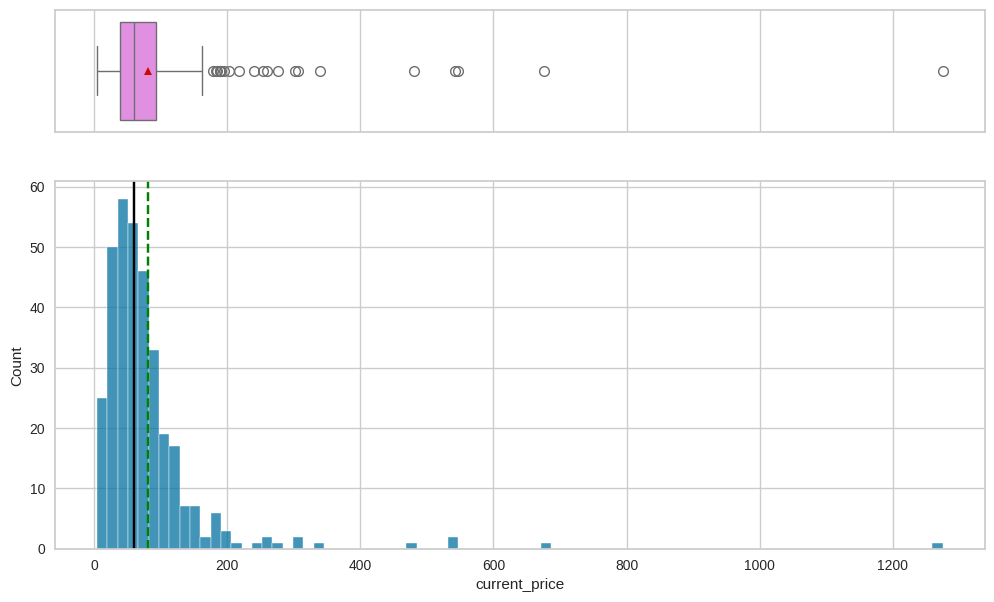

In [20]:
#creating histogram_boxplot for 'current_price'
histogram_boxplot(data1, 'current_price')

The distribution of the current price is abit skewed with many high outlier prices.

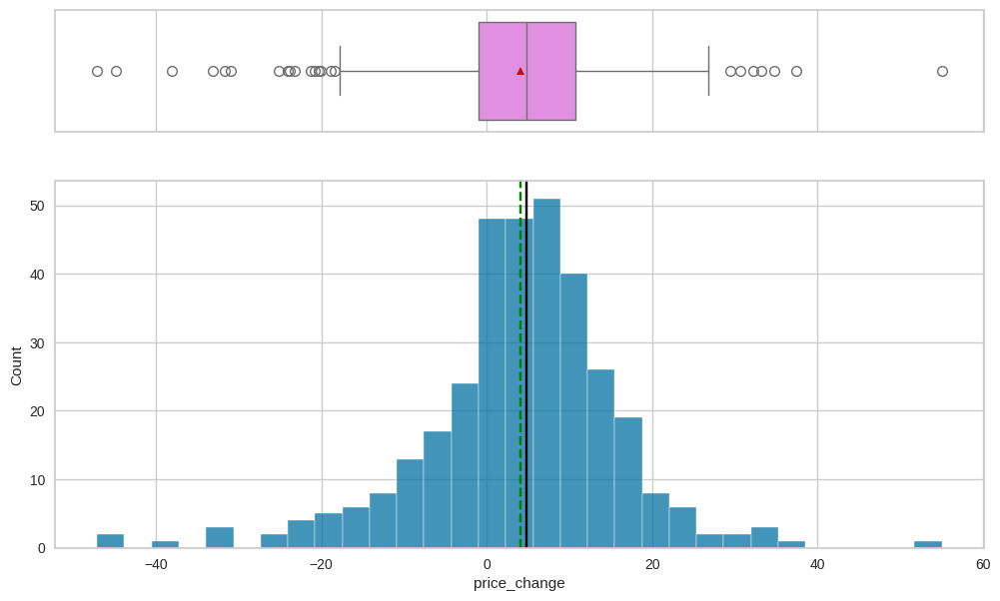

In [21]:
#creating histogram_boxplot for 'price_change'
histogram_boxplot(data1, 'price_change')

The data of the price change counts is somehow normally distributed. The price change had both high and low outlier counts.

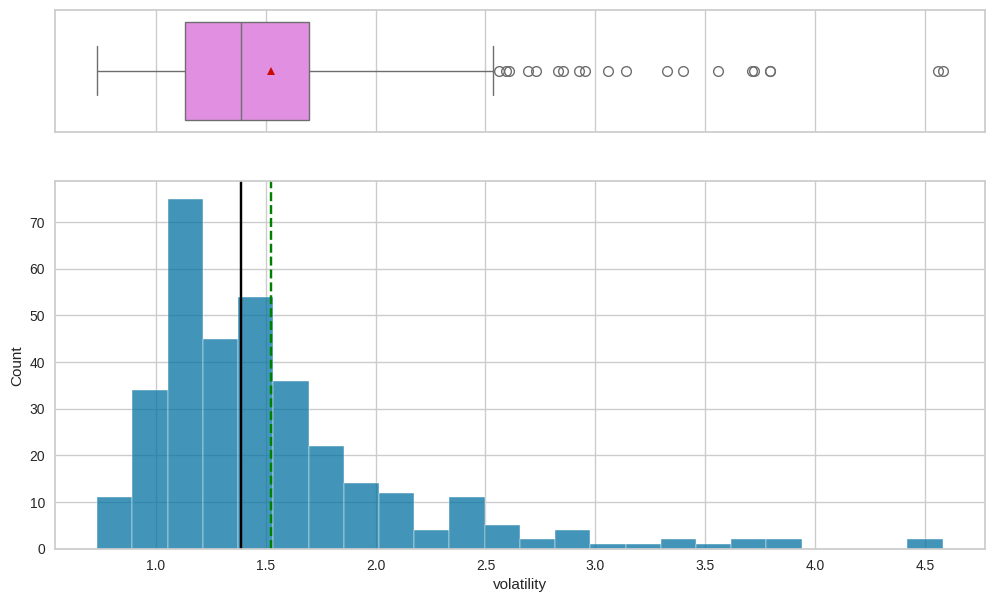

In [22]:
# creating histogram_boxplot for 'Volatility'
histogram_boxplot(data1, 'volatility')

The distribution of volatility data somewhat normally distributed with a bit of skewness. The median was about 1.4. The data had outliers.

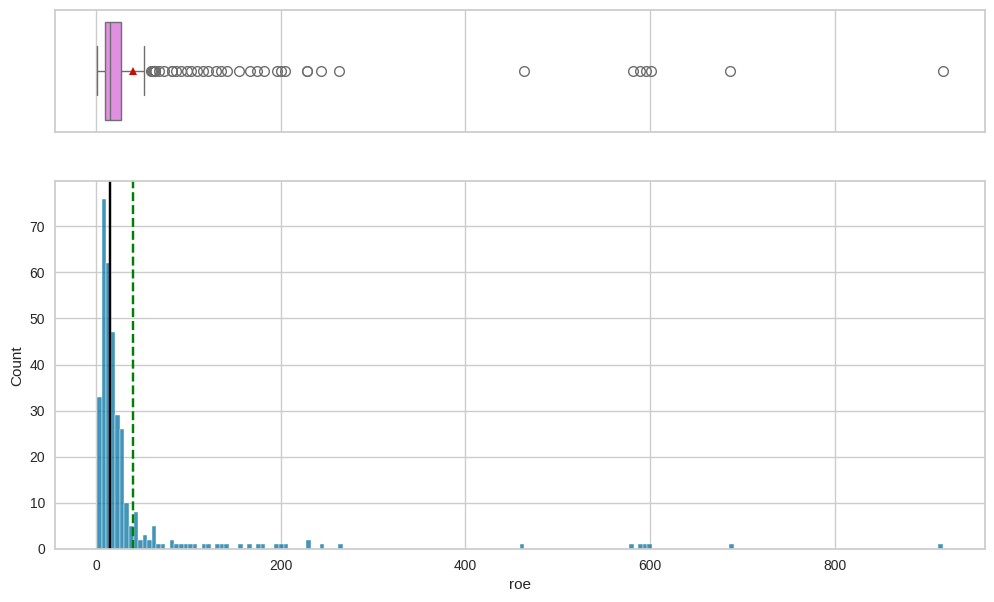

In [23]:
## Creating histogram_boxplot for 'ROE'
histogram_boxplot(data1, 'roe')

The dataframe was skewed. There very many outlier ROE higher values.

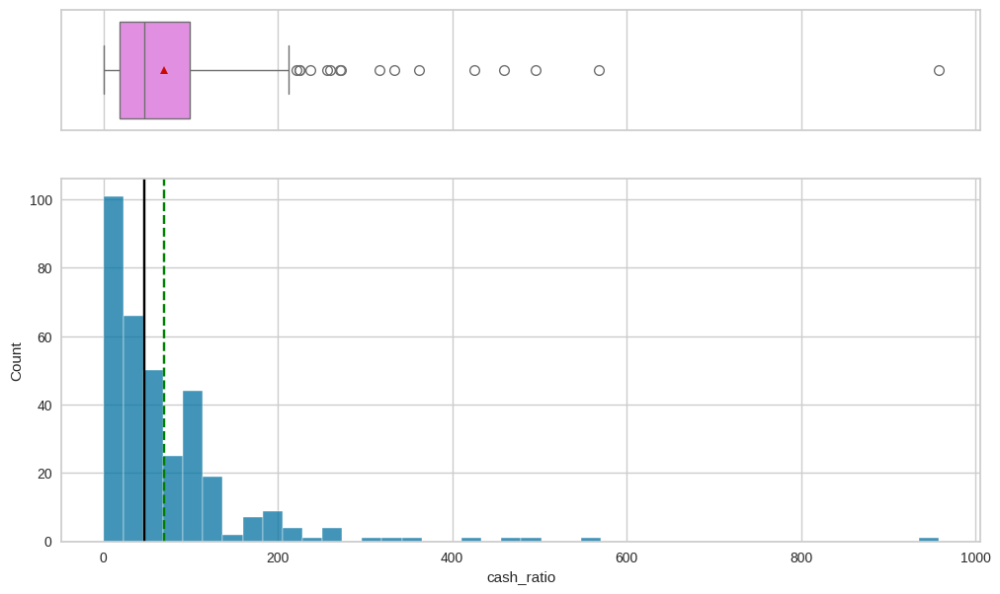

In [24]:
## Creating histogram_boxplot for 'Cash Ratio'
histogram_boxplot(data1, 'cash_ratio')

The distribution of cash ratio counts is skewed. The data has high outlier value.

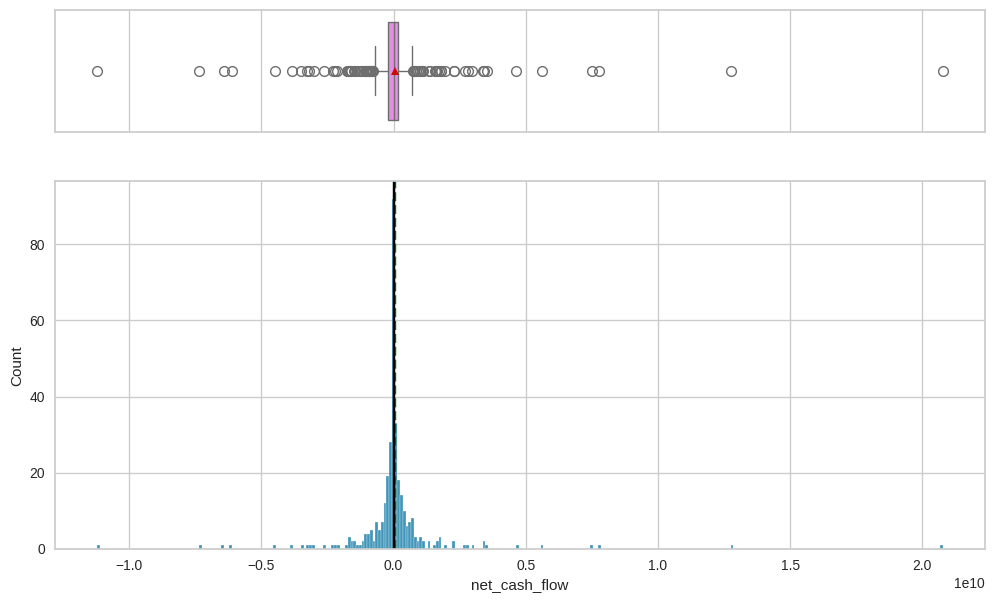

In [25]:
## Creating histogram_boxplot for 'net cash flow'
histogram_boxplot(data1, 'net_cash_flow')

The mean and median of net cash flow was about 0.0. The data had both negative and positive outlier counts.

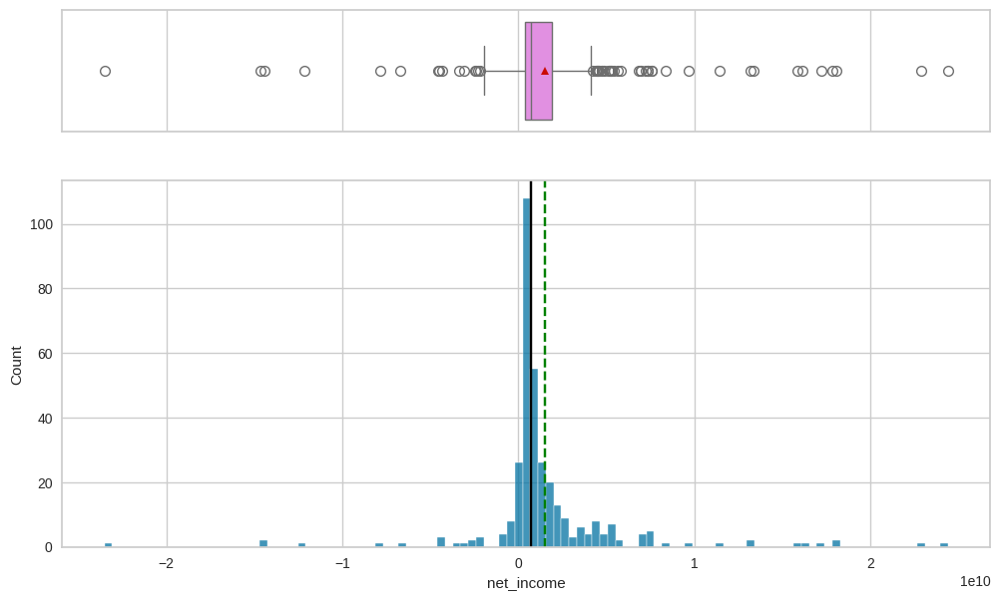

In [26]:
## Complete the code to create histogram_boxplot for 'Net Income'
histogram_boxplot(data1, 'net_income')

Data was skwed. The data had both negative and positive outlier counts.

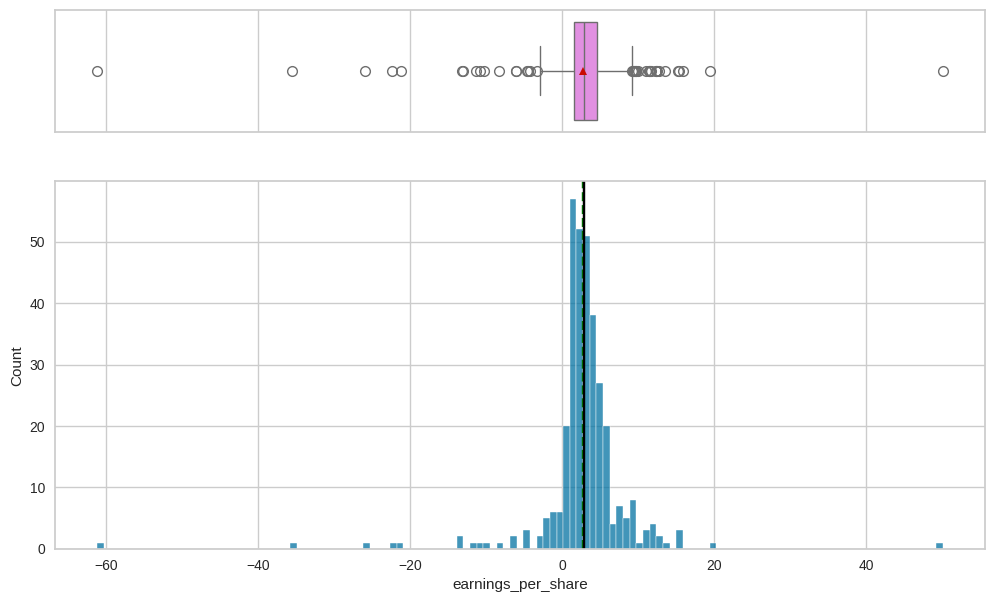

In [27]:
## Creating histogram_boxplot for 'Earnings Per Share'
histogram_boxplot(data1, 'earnings_per_share')

The data had many outliers

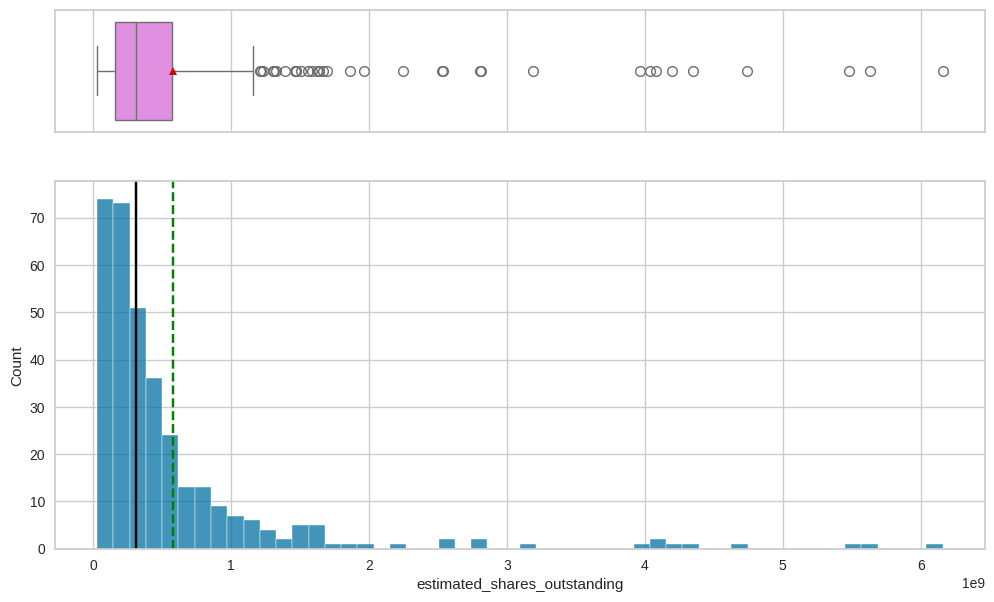

In [28]:
## Creating histogram_boxplot for 'Estimated Shares Outstanding'
histogram_boxplot(data1, 'estimated_shares_outstanding')

Distribution of the data was extremely skewed to the left. The median was and mean were below 0.5

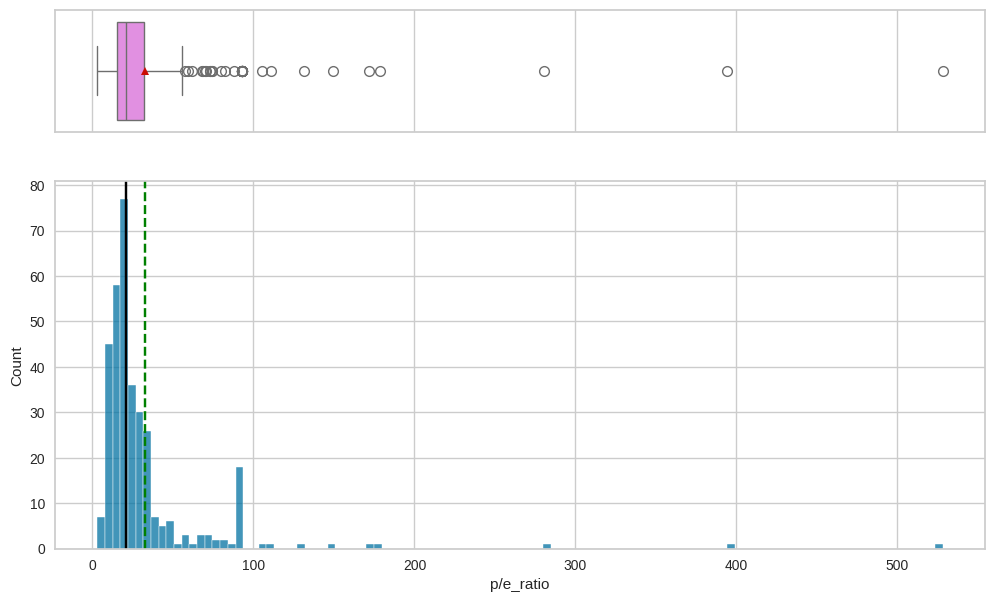

In [29]:
## creating histogram_boxplot for 'P/E Ratio'
histogram_boxplot(data1, 'p/e_ratio')

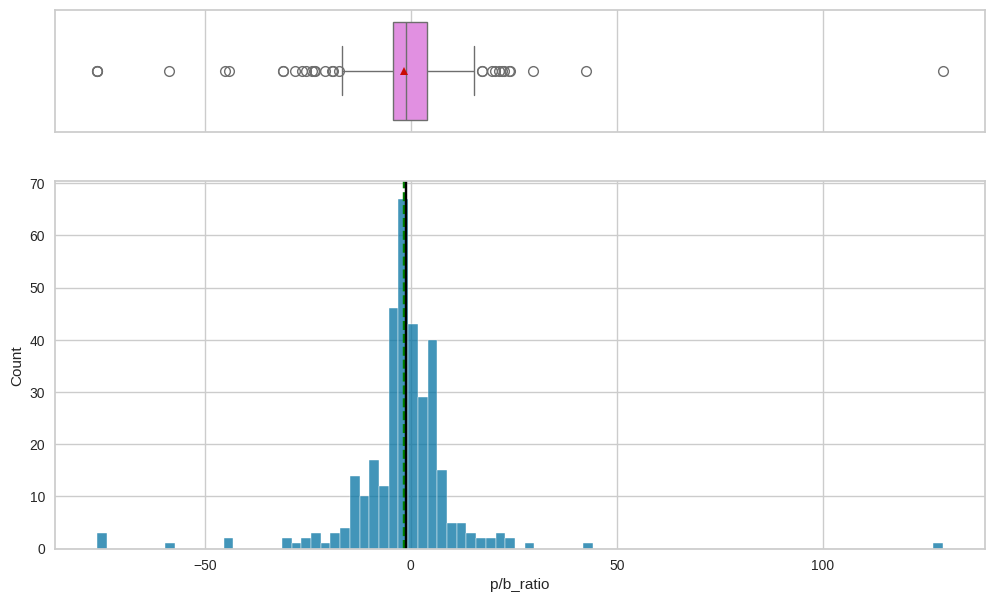

In [30]:
 ## Creating histogram_boxplot for 'P/B Ratio'
histogram_boxplot(data1, 'p/b_ratio')

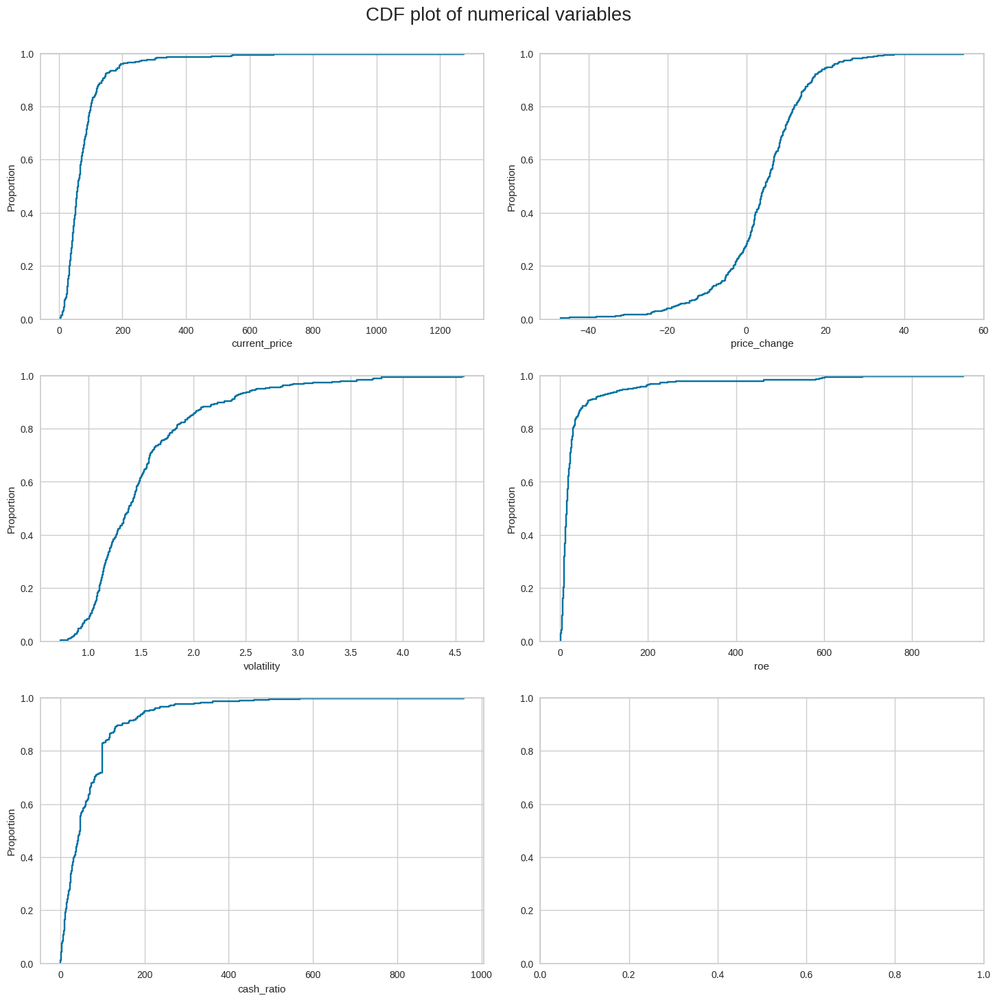

In [31]:
#creating CDF plots for numrical data
num_col1 = ['current_price', 'price_change', 'volatility',
           'roe', 'cash_ratio', 'net_cash_flow', 'net_income', 'earnings_per_share', 'estimated_shares_outstanding',
           'p/e_ratio', 'p/b_ratio']
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
fig.suptitle("CDF plot of numerical variables", fontsize=20)
counter = 0
for ii in range(3):
    sns.ecdfplot(ax=axes[ii][0], x=data1[num_col1[counter]])
    counter = counter + 1
    if counter != 5:
        sns.ecdfplot(ax=axes[ii][1], x=data1[num_col1[counter]])
        counter = counter + 1
    else:
        pass

fig.tight_layout(pad=2.0)

The CDF plots for some numerical data indicating the proportion of counts for different variable values.
About 75% of the stocks has cash ratio of below 100.
About 60% had volatity of 1.5.

In [32]:
# function to create labeled barplots


def labeled_barplot(df, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(df[feature])  # length of the column
    count = df[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=df,
        x=feature,
        order=df[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

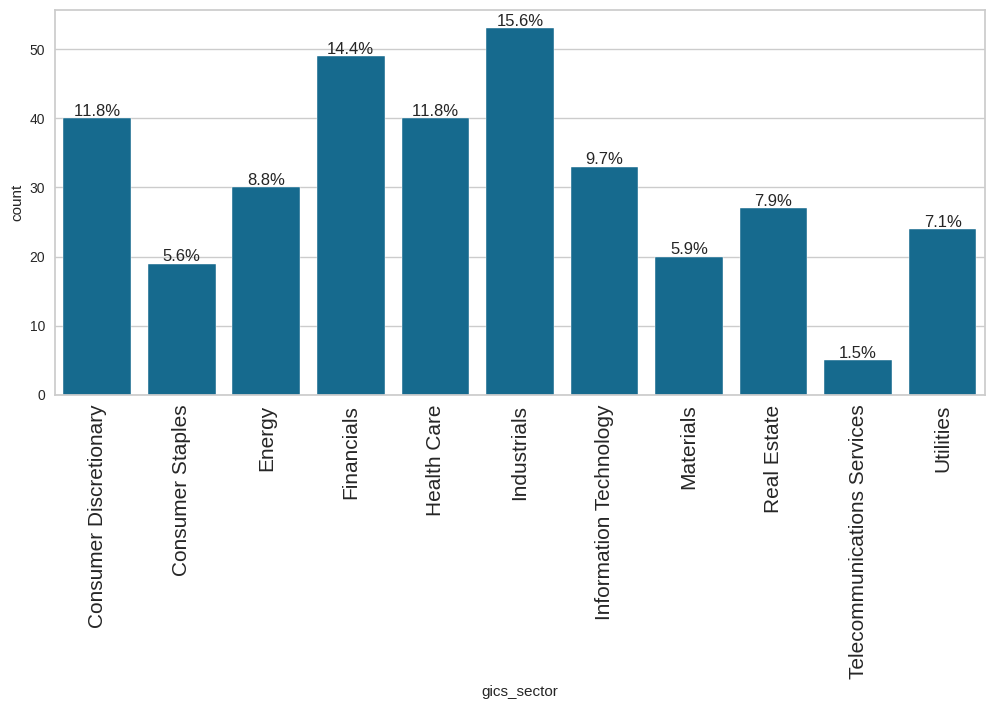

In [33]:
#Creating labeled_barplot for 'gics_sector'
labeled_barplot(data1, 'gics_sector', perc=True)

The most proportion of the Gics sector comprised industries (15.6%) and financials (14.4).

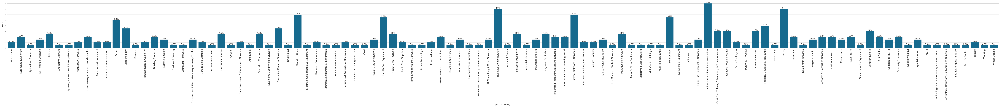

In [34]:
## Creating a labelled barplot for 'GICS Sub Industry'
labeled_barplot(data1, 'gics_sub_industry', perc=True)

The labelled barplot for Gics sub county is as indicated.

#Bivariate Analysis

Feature engineering to add colums for market cap, liquidity ratio and  earning yield

In [35]:
# function to create labeled barplots


def labeled_barplot(df, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(df[feature])  # length of the column
    count = df[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=df,
        x=feature,
        order=df[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [36]:
# creating engineered columns for market cap, liquidity ratio and earning yield
data1['earning_yields'] = data1['current_price']/data1['earnings_per_share']

#Market Cap=Current Price×Estimated Shares Outstanding
data1['Market Cap'] = data1['current_price']*data1['estimated_shares_outstanding']

#Liquidity ratio
data1['Liquidity_ratio'] = data1['current_price']/data1['cash_ratio']
data1.head()

,ticker_symbol,security,gics_sector,gics_sub_industry,current_price,price_change,volatility,roe,cash_ratio,net_cash_flow,net_income,earnings_per_share,estimated_shares_outstanding,p/e_ratio,p/b_ratio,earning_yields,Market Cap,Liquidity_ratio
0,AAL,American Airlines Group,Industrials,Airlines,42.349998,9.999995,1.687151,135,51,-604000000,7610000000,11.39,6.681299e+08,3.718174,-8.784219,3.718174,2.829530e+10,0.830392
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.240002,8.339433,2.197887,130,77,51000000,5144000000,3.15,1.633016e+09,18.806350,-8.750068,18.806350,9.673986e+10,0.769351
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.910000,11.301121,1.273646,21,67,938000000,4423000000,2.94,1.504422e+09,15.275510,-0.394171,15.275510,6.756358e+10,0.670299
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.940002,13.977195,1.357679,9,180,-240840000,629551000,1.26,4.996437e+08,74.555557,4.199651,74.555557,4.693653e+10,0.521889
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320000,-1.827858,1.701169,14,272,315120000,696878000,0.31,2.247994e+09,178.451613,1.059810,178.451613,1.243590e+11,0.203382


The dataframe has 3 new variables, earning_yields,	Market Cap	and Liquidity_ratio

In [37]:
# checking the shape of the new dataframe
data1.shape

(340, 18)

The number of variables has increased to 18 from 15

In [ ]:
# checking the summary of the new dataframe
data1.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ticker_symbol,340,340,AAL,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
security,340,340,American Airlines Group,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gics_sector,340,11,Industrials,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gics_sub_industry,340,104,Oil & Gas Exploration & Production,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
current_price,340.0,NaN,NaN,NaN,80.862345,98.055086,4.5,38.555,59.705,92.880001,1274.949951
price_change,340.0,NaN,NaN,NaN,4.078194,12.006338,-47.129693,-0.939484,4.819505,10.695493,55.051683
volatility,340.0,NaN,NaN,NaN,1.525976,0.591798,0.733163,1.134878,1.385593,1.695549,4.580042
roe,340.0,NaN,NaN,NaN,39.597059,96.547538,1.0,9.75,15.0,27.0,917.0
cash_ratio,340.0,NaN,NaN,NaN,70.023529,90.421331,0.0,18.0,47.0,99.0,958.0
net_cash_flow,340.0,NaN,NaN,NaN,55537620.588235,1946365312.175789,-11208000000.0,-193906500.0,2098000.0,169810750.0,20764000000.0


Summary of the created variables is included in the table. The earning_yields had a mean of 24.4 and ranged between -118 to 528. Market Cap had a mean of 4643618601.9 while liquidity ration had an infinite number.

In [38]:
# The stocks of which economic sector have seen the maximum price increase on average
data1.groupby('gics_sector')['price_change'].mean().sort_values()

gics_sector
Energy                        -10.228289
Utilities                       0.803657
Industrials                     2.833127
Financials                      3.865406
Materials                       5.589738
Consumer Discretionary          5.846093
Real Estate                     6.205548
Telecommunications Services     6.956980
Information Technology          7.217476
Consumer Staples                8.684750
Health Care                     9.585652
Name: price_change, dtype: float64

There is a variation on the maximum price increase across the different economic sectors. The energy sector experienced a negative maximum price increase on average meaning it recorded a decrease in price increases (-10.23). The health care recorded the highest price icrease (9.59).

In [41]:
#  Understanding how the average cash ratio vary across economic sectors

data1.groupby('gics_sector')['cash_ratio'].mean().sort_values(ascending=False)

gics_sector
Information Technology         149.818182
Telecommunications Services    117.000000
Health Care                    103.775000
Financials                      98.591837
Consumer Staples                70.947368
Energy                          51.133333
Real Estate                     50.111111
Consumer Discretionary          49.575000
Materials                       41.700000
Industrials                     36.188679
Utilities                       13.625000
Name: cash_ratio, dtype: float64

Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents.   The average cash ratio across the different GICS sectors varied. The information technology sector had the highest average cash ratio folowed by the telecommunication services sector. The utilities and industries recorded the least cash ratio cah and cash equivalents.    

In [42]:
#    Understanding how the P/E ratio vary on average across economic sectors
data1.groupby('gics_sector')['p/e_ratio'].mean().sort_values(ascending=False)

gics_sector
Energy                         72.897709
Information Technology         43.782546
Real Estate                    43.065585
Health Care                    41.135272
Consumer Discretionary         35.211613
Consumer Staples               25.521195
Materials                      24.585352
Utilities                      18.719412
Industrials                    18.259380
Financials                     16.023151
Telecommunications Services    12.222578
Name: p/e_ratio, dtype: float64

The performance of P/E ratio across the economy sectors varied. P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. The energy sector recorded the highest P/E ratio while the telecommunication services had the least P/E ratio.

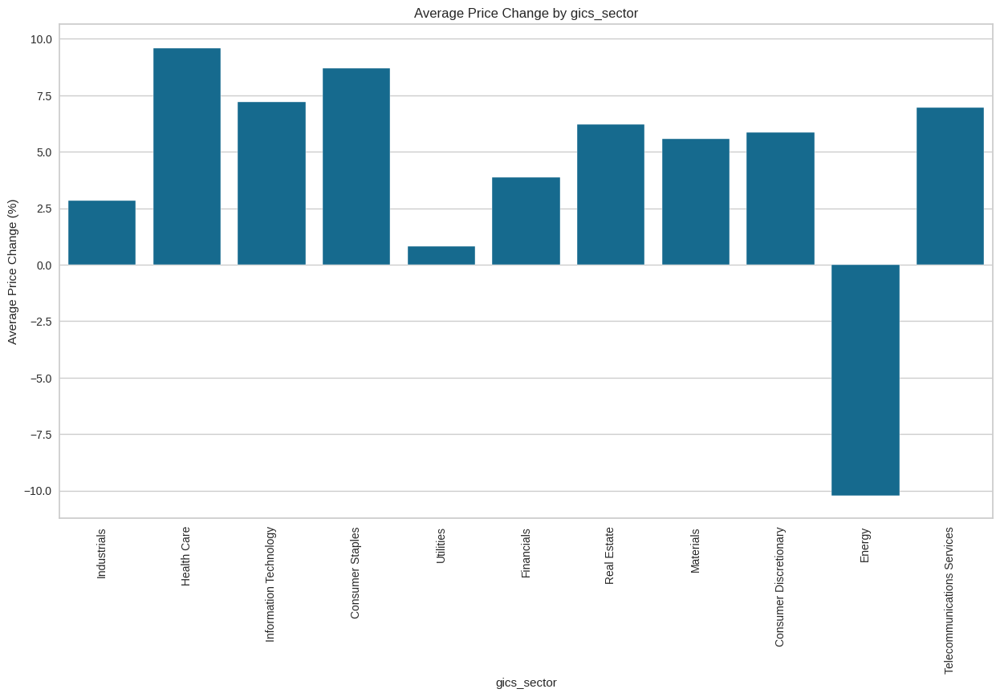

In [44]:
# Barplot for the relation between the gic sector and % price change
plt.figure(figsize=(15, 8))
sns.barplot(data=data1, x='gics_sector', y='price_change', ci=False)
plt.xticks(rotation=90)
plt.xlabel('gics_sector')
plt.ylabel('Average Price Change (%)')
plt.title('Average Price Change by gics_sector')
plt.show()

There is a variation in the relation between % price change across the economic sectors. All the economic sectors realized a positive average price change in their stocks except for the energy sector.

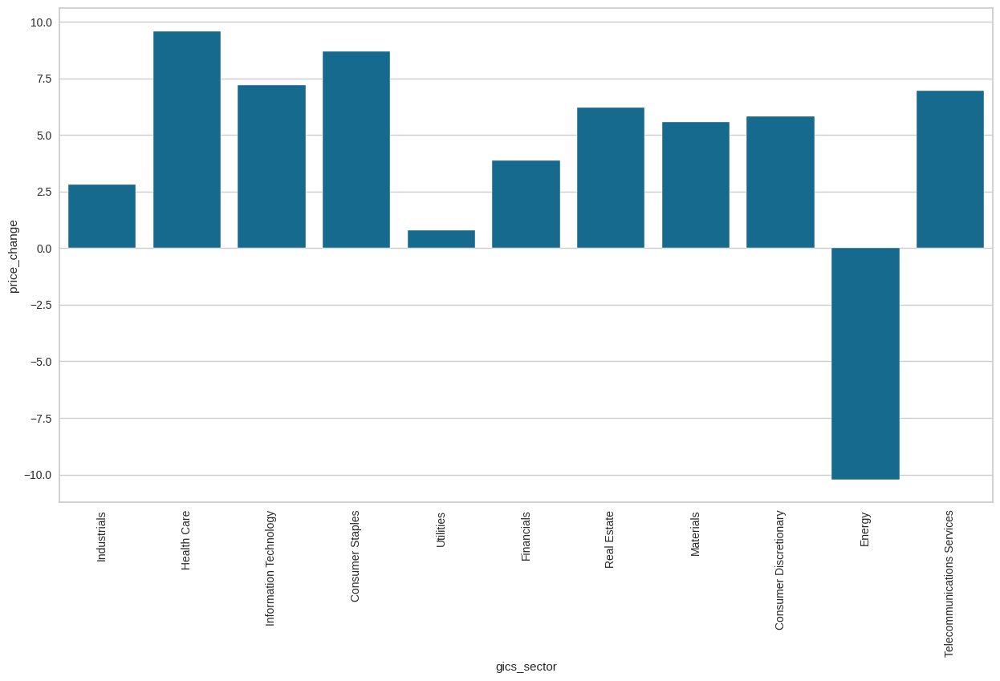

In [50]:
# Barplot for the relation between the gic sector and price change
plt.figure(figsize=(15,8))
sns.barplot(data=data1, x='gics_sector', y='price_change', ci=False)  ## Complete the code to choose the right variables
plt.xticks(rotation=90)
plt.show()

There is a variation in the relation between price change across the economic sectors. All the economic sectors realized a positive average price change in their stocks except for the energy sector.

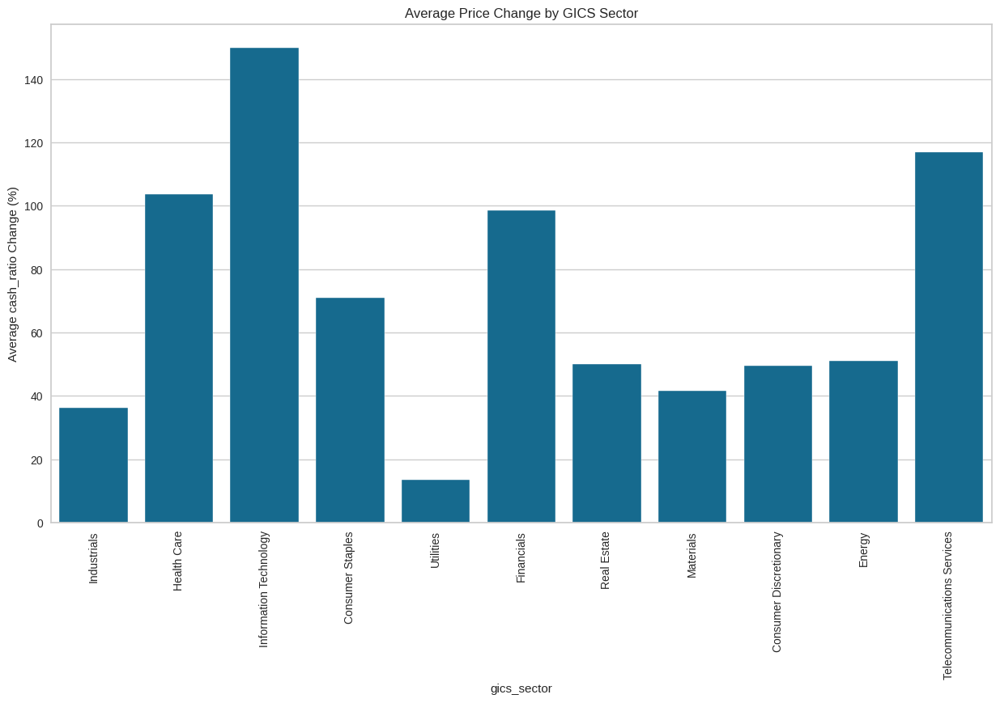

In [45]:
# Barplot for changes cash ratio across the economic sectors
plt.figure(figsize=(15,8))
sns.barplot(data=data1, x='gics_sector', y='cash_ratio', ci=False)
plt.xticks(rotation=90)
plt.xlabel('gics_sector')
plt.ylabel('Average cash_ratio Change (%)')
plt.title('Average Price Change by GICS Sector')
plt.show()

The percent cash ratio changes across all the Gic economic sectors was positive with the It, health and financial sectors recording the highest changes and the ulities the least.

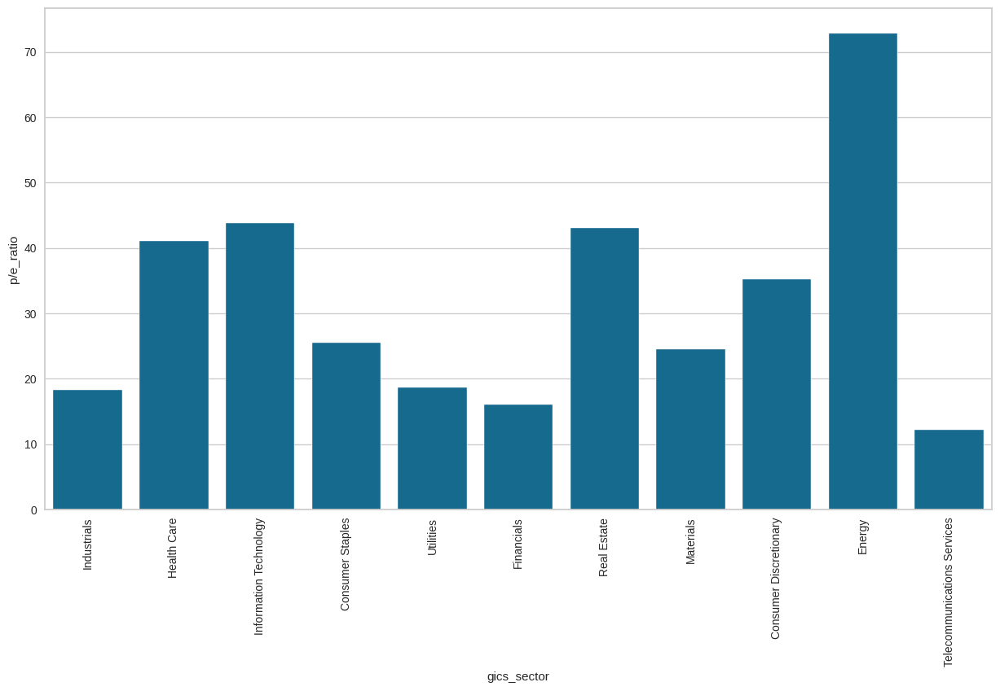

In [46]:
# Barplot for changes in gic sector and p/e_ratio
plt.figure(figsize=(15,8))
sns.barplot(data=data1, x='gics_sector', y='p/e_ratio', ci=False)
plt.xticks(rotation=90)
plt.show()

The eergy, real estate and IT realized the highest P/E ratio while the financials, industries and utilities recorded the least P/E ratio.

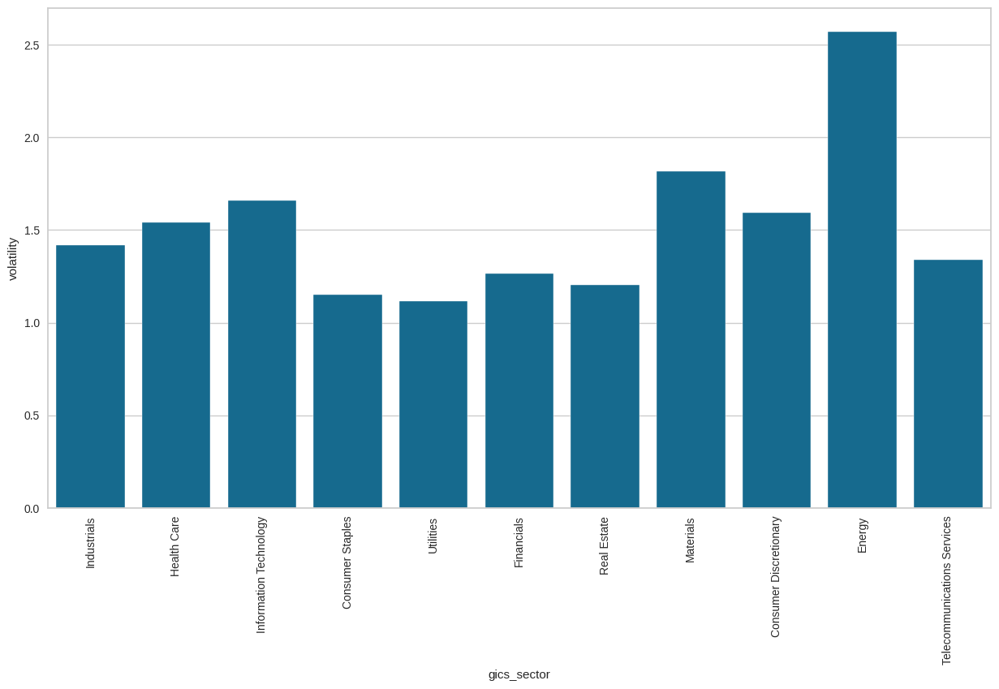

In [48]:
# Barplot for changes in gic sector and volatility'
plt.figure(figsize=(15,8))
sns.barplot(data=data1, x='gics_sector', y='volatility', ci=False)
plt.xticks(rotation=90)
plt.show()

Energy and materials sectors realized the higest volatility in their stock.

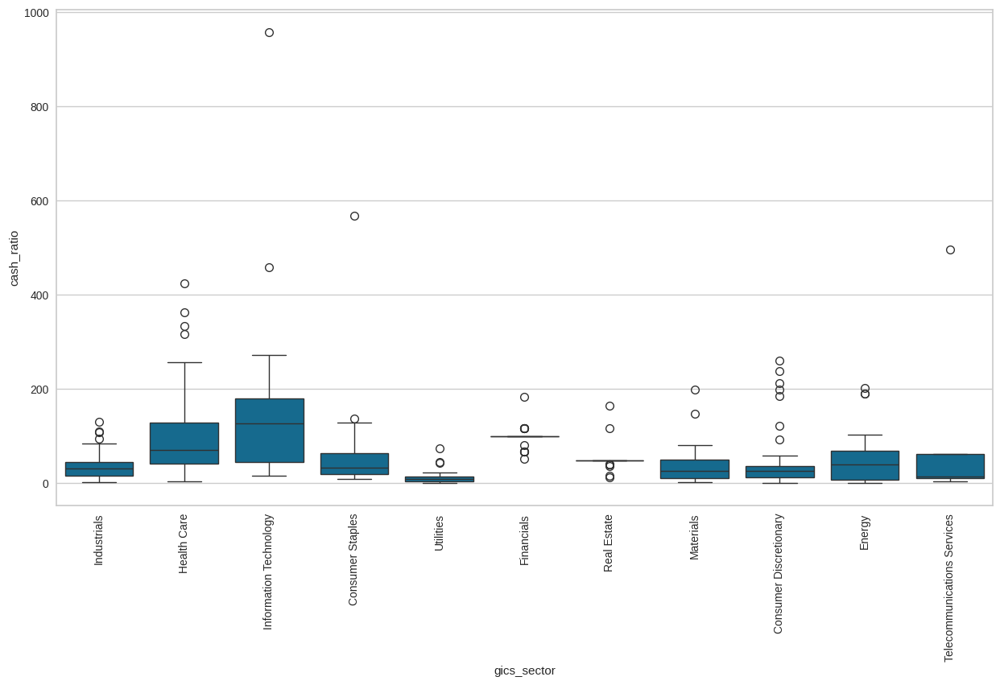

In [49]:
# boxplot analysis for cash ratio and Gic sectors
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='cash_ratio')
plt.xticks(rotation=90)
plt.show()

There was a variation on the performance of cash ratio across the sectors. Most economic sectors recorded outlier values in their cash ratios. Most outlier cash ratio values was positive while a few including real estate and financial recorded negative outlier values. The IT sector recorded the highest median cash ratio followed by health care. Utilities and consummer discretionary sectors realized the lowest median cash ratio values.

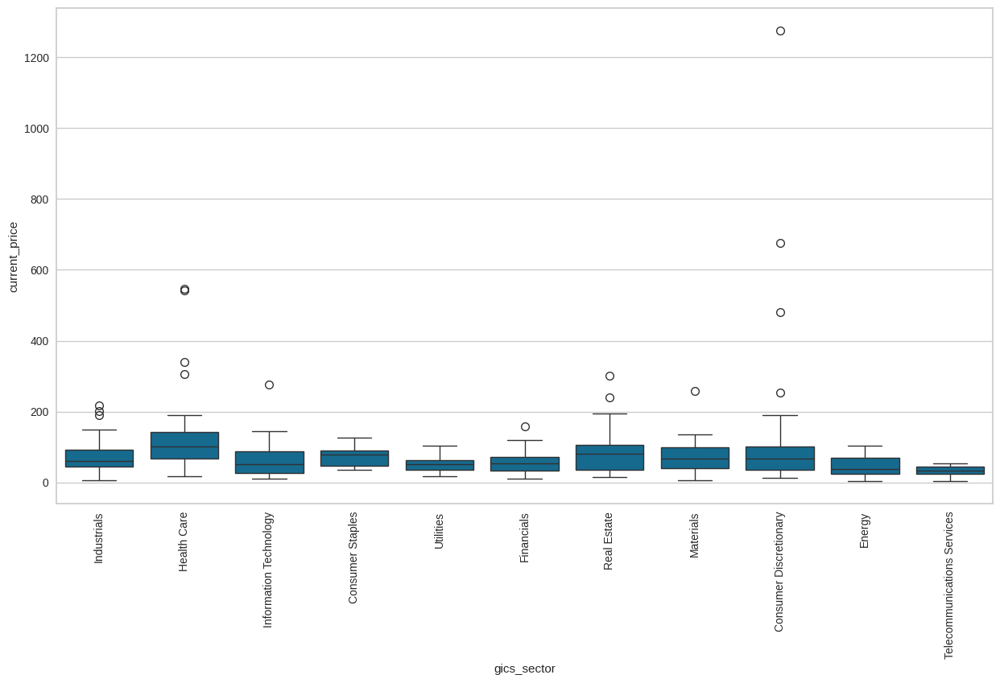

In [ ]:
# boxplot analysis for current price and Gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='current_price')
plt.xticks(rotation=90)
plt.show()

There was low variation in the the current price of stocks across the economic sectors.

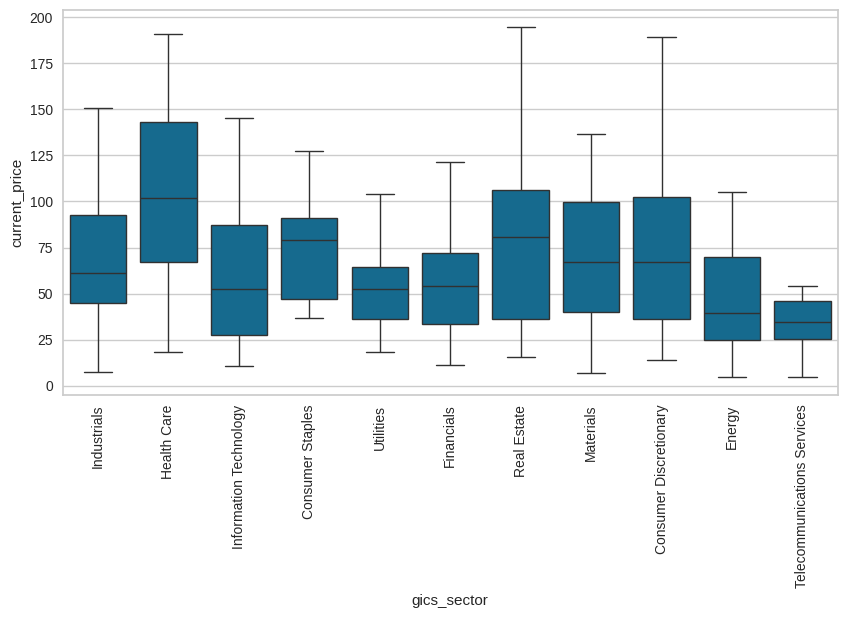

In [75]:
# boxplot for anlaysis of current price and Gics sector
plt.figure(figsize=(10,5))
sns.boxplot(data=data1,x='gics_sector',y='current_price',showfliers=False) # turning off outliers
plt.xticks(rotation=90)
plt.show()

The current price ranges across the different Gics sector without outliers is indicated.

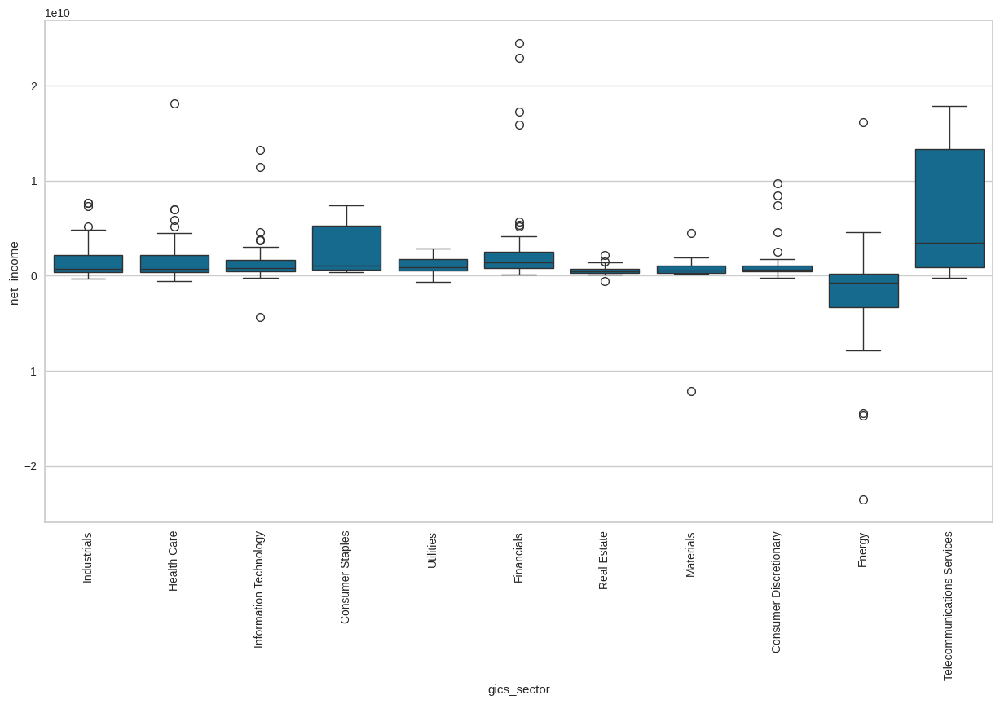

In [51]:
# boxplot analysis for net income and gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='net_income')
plt.xticks(rotation=90)
plt.show()

The net income of stocks across the difernt economic sectors varied. Both positive and negative net income was realized. The net income ranged from the negative to positive values as well as outlier net income values.

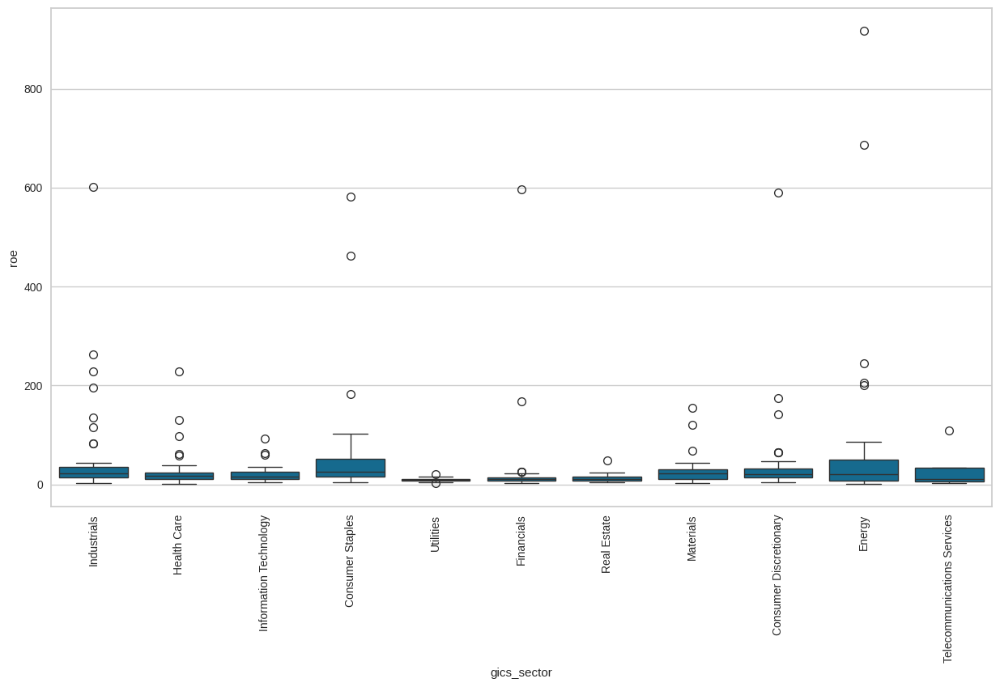

In [52]:
# boxplot analysis for cost of the ROE and Gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='roe')
plt.xticks(rotation=90)
plt.show()

There was little variation in the ROE across all the economic sectors. Most sectors recorded outliers with some sectors recording very high outlier values.

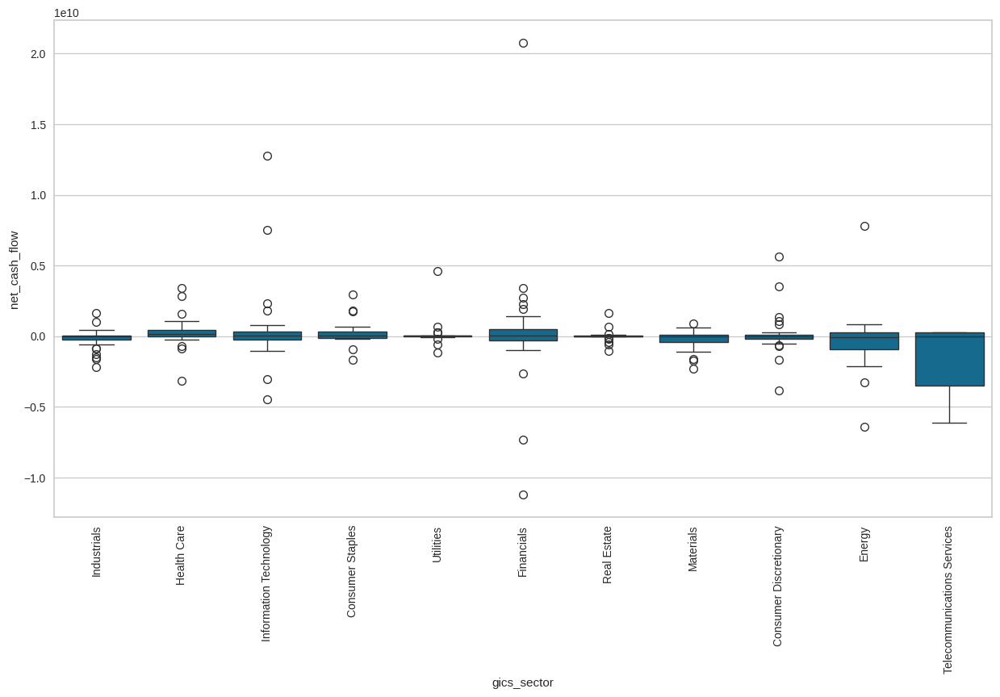

In [ ]:
# boxplot analysis for net cash flow and Gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='net_cash_flow')
plt.xticks(rotation=90)
plt.show()

Most sectors recorded no significant gains in the net cash flow. In fact some sectors including the telecommunications services realized high negative net cash flow ranges. Most sectors recorded outlier net cash flow values with most being positive.

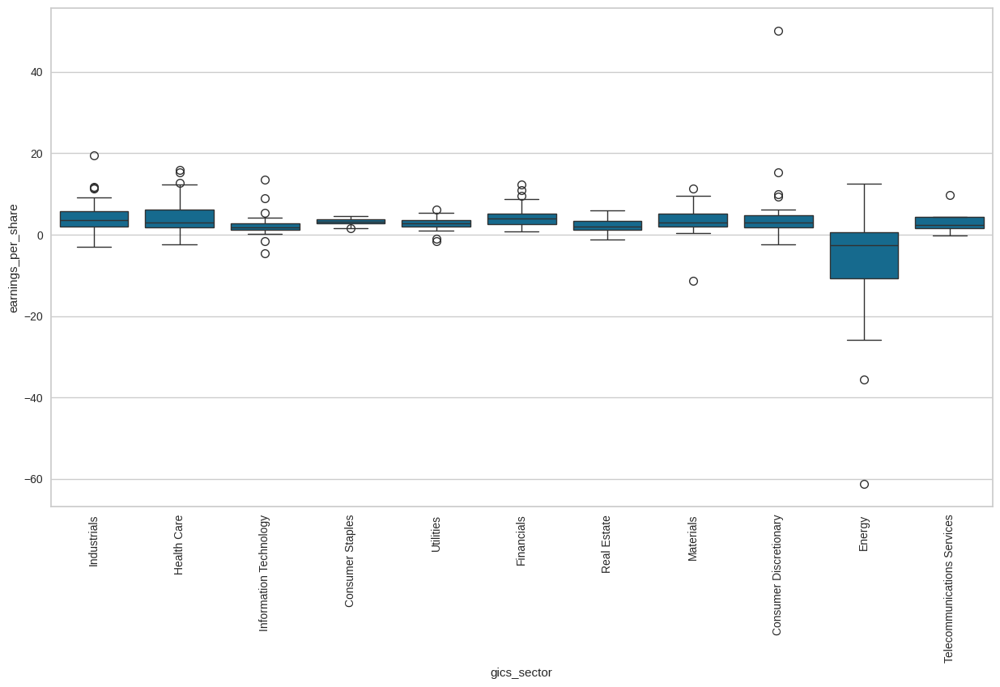

In [ ]:
# boxplot analysis for earnings per share and gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='earnings_per_share')
plt.xticks(rotation=90)
plt.show()

There was little variation in the earnings per share across the different economics sectors. Some sectors recorded negative and positive outlier earnings per share. The sectors recorded oth positive and negative earnings per share. The energy sector recorde the highest range in the earnings per share values which had a negative median value.

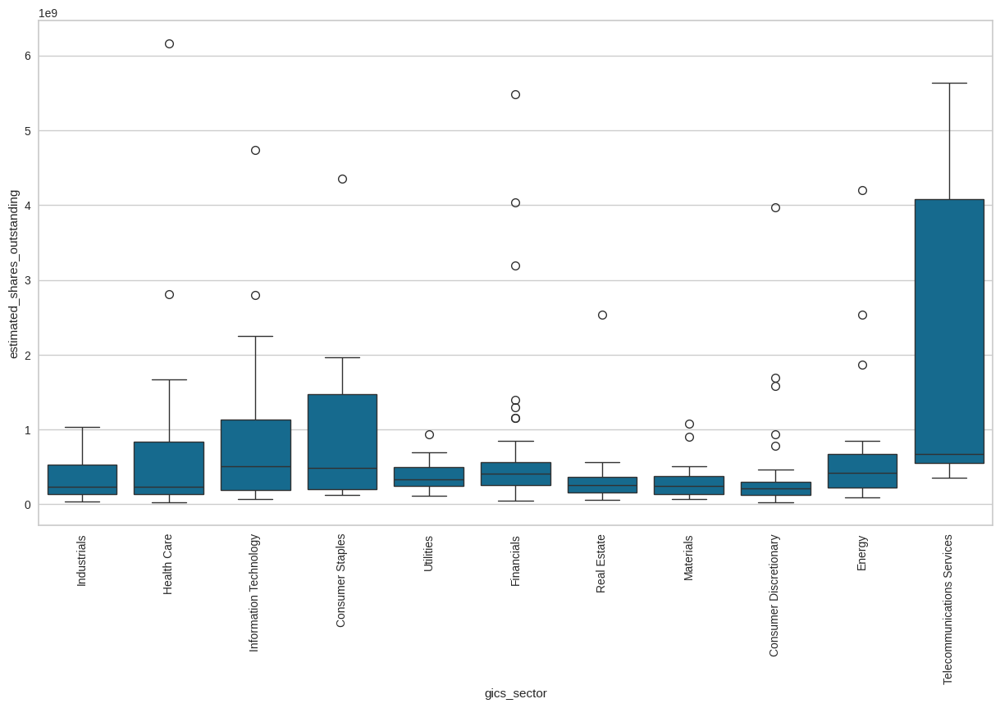

In [ ]:
# boxplot analysis for estimated shares outstanding and Gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='estimated_shares_outstanding')
plt.xticks(rotation=90)
plt.show()

There was low variation in the median estimated shares outstanding values across the economic sectors. Most sectors recorded outlier values. The highest median estimated shares outstanding was recorded by the consumer staples and IT sectors.

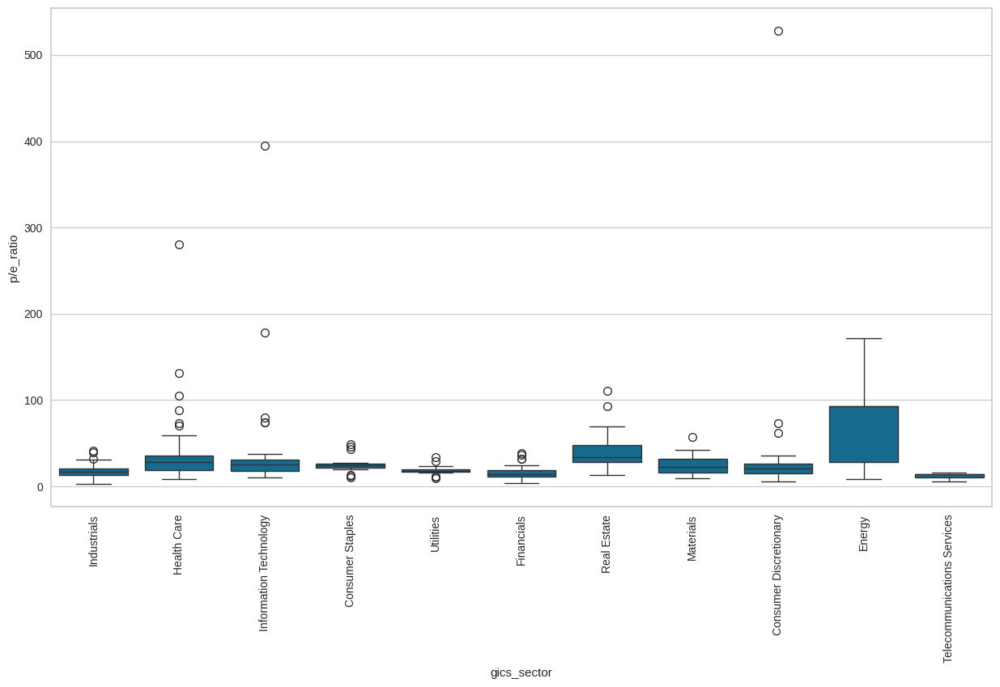

In [58]:
# boxplot analysis for cost of the P/E ratio and Gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='p/e_ratio')
plt.xticks(rotation=90)
plt.show()

Little variation in the p/e ratio was observed across the economic sectors. Both positive and negative outlier P/E ratio values were observed across the economic sectors. Energy sector realized the highest p/e ratio ranges although without outlier values.

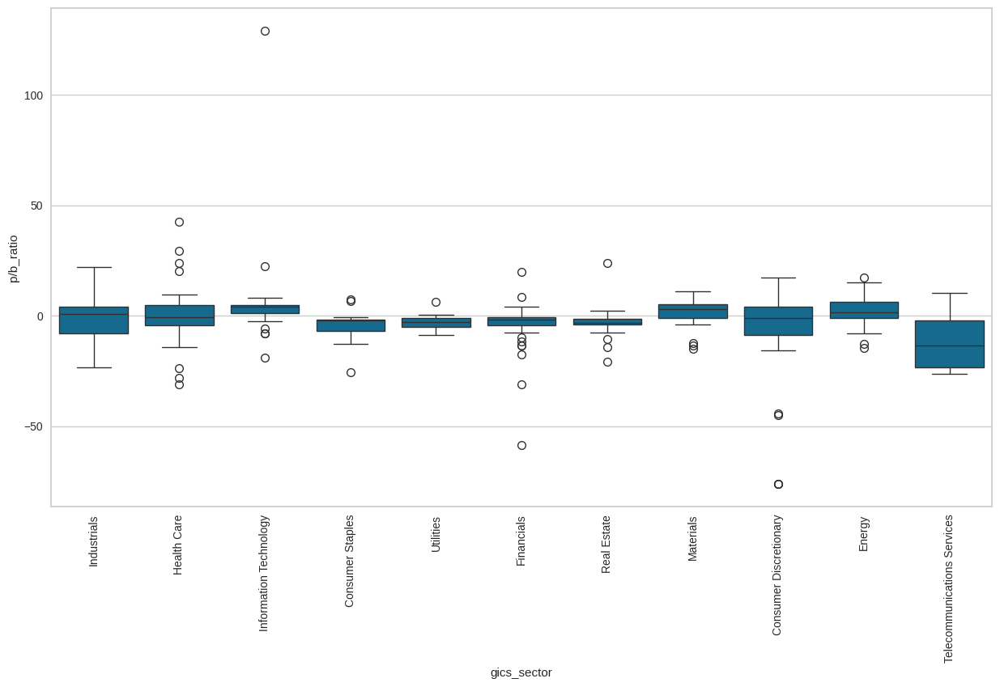

In [59]:
# boxplot analysis for P/E ratio and Gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='p/b_ratio')
plt.xticks(rotation=90)
plt.show()

There was hardly any P/B ratio gains across the sectors. Outlier values that were positive and negative were observed.

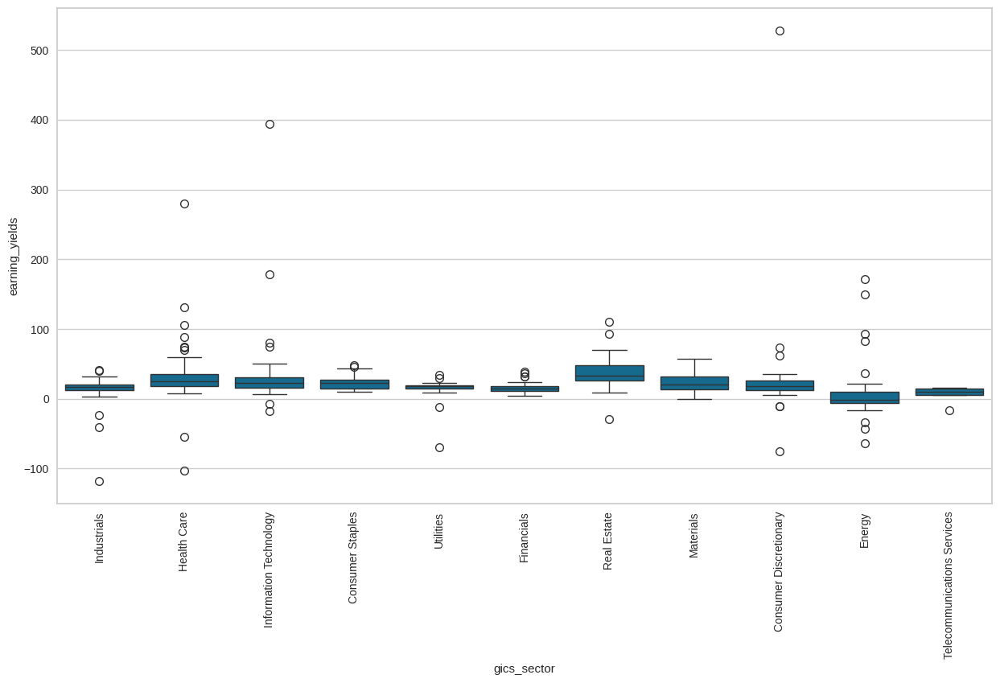

In [67]:
# boxplot analysis for earnings yield and Gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='earning_yields')
plt.xticks(rotation=90)
plt.show()

There was low variation in the earnings yields across the economic sectors. All sectors except material economic sector recoded outlier earnings yield values.

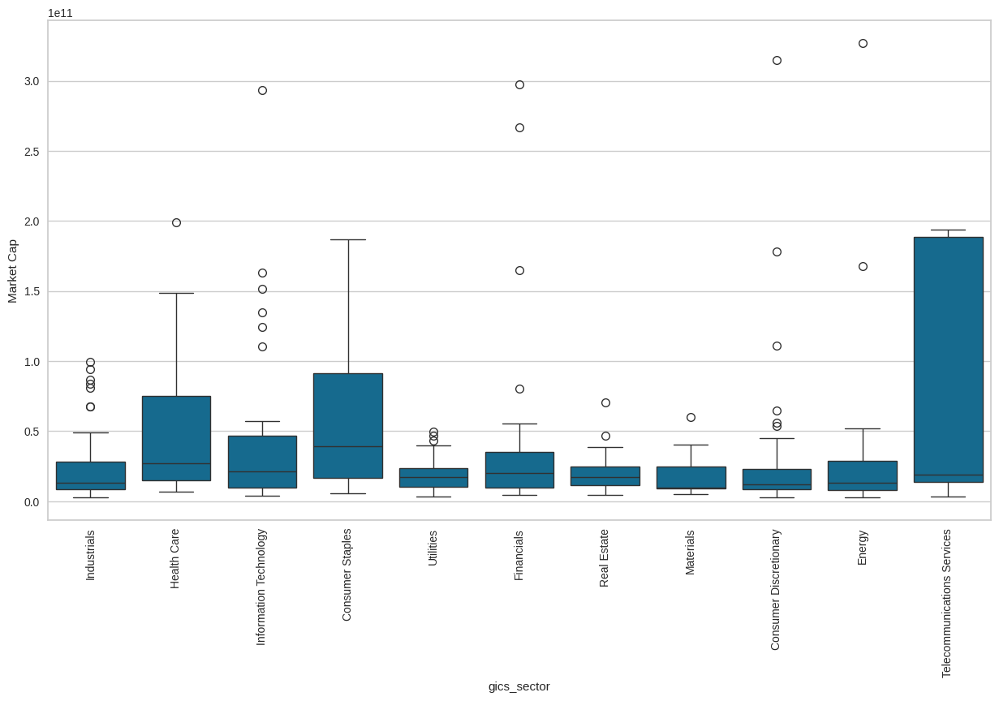

In [68]:
# boxplot analysis for maret cap and Gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='Market Cap')
plt.xticks(rotation=90)
plt.show()

There was a high variation and ranges in the market cap  across the economic sectors. The consumer staples sector realized the highest median market cap value while materials sector recorded the lest. The telecommunication services sector realized the highest market cap range values while the conumer discretionary sector realised the least value.

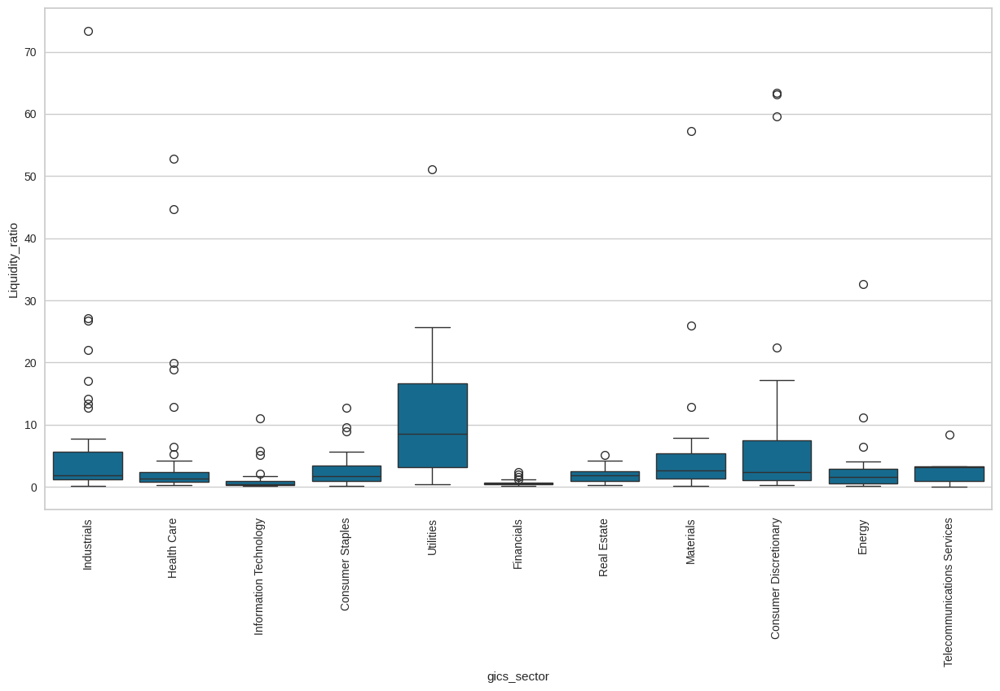

In [70]:
 # boxplot analysis for liquidity ratio and Gics sector
plt.figure(figsize=(15,8))
sns.boxplot(data=data1,x='gics_sector',y='Liquidity_ratio')
plt.xticks(rotation=90)
plt.show()

Most sectors recorded low liquidity ratios. Median liquidity rations were low as was the range values. However most sectors realized outlier liquidity ratios. Utilities sector realized the highest liquidity ratio range.

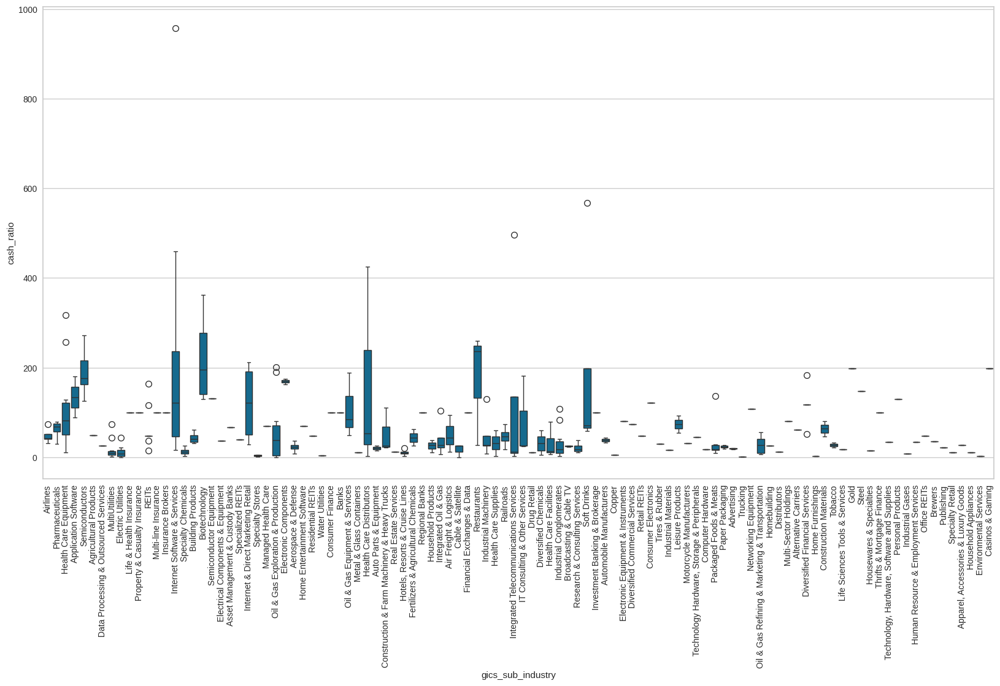

In [72]:
# boxplot analysis for cash ratio and Gics sub industry

plt.figure(figsize=(20,10))
sns.boxplot(data=data1,x='gics_sub_industry',y='cash_ratio')
plt.xticks(rotation=90)
plt.show()

Alot of variation was observed in the cash ratios for the Gics sub industry. There were significant ranges in median value and range values across the sub industry.

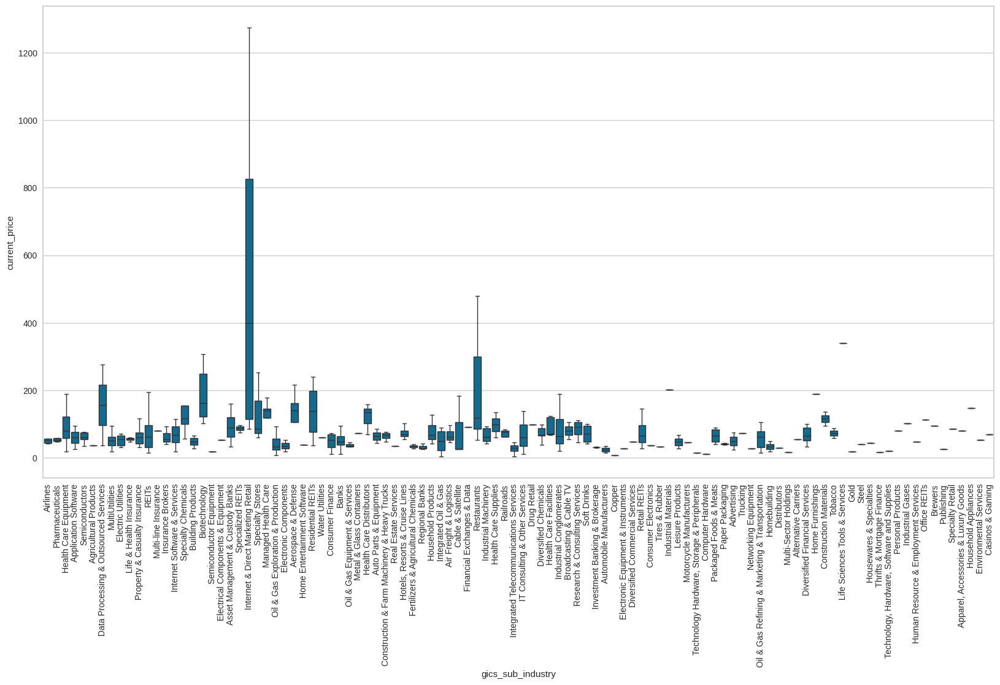

In [76]:
# boxplot for analysis of current price and gics sub industry
plt.figure(figsize=(20,10))
sns.boxplot(data=data1,x='gics_sub_industry',y='current_price',showfliers=False) # turning off outliers
plt.xticks(rotation=90)
plt.show()

Alot of variation was observed in the current price for the Gics sub industry. There were significant ranges in median value and range values across the sub industry

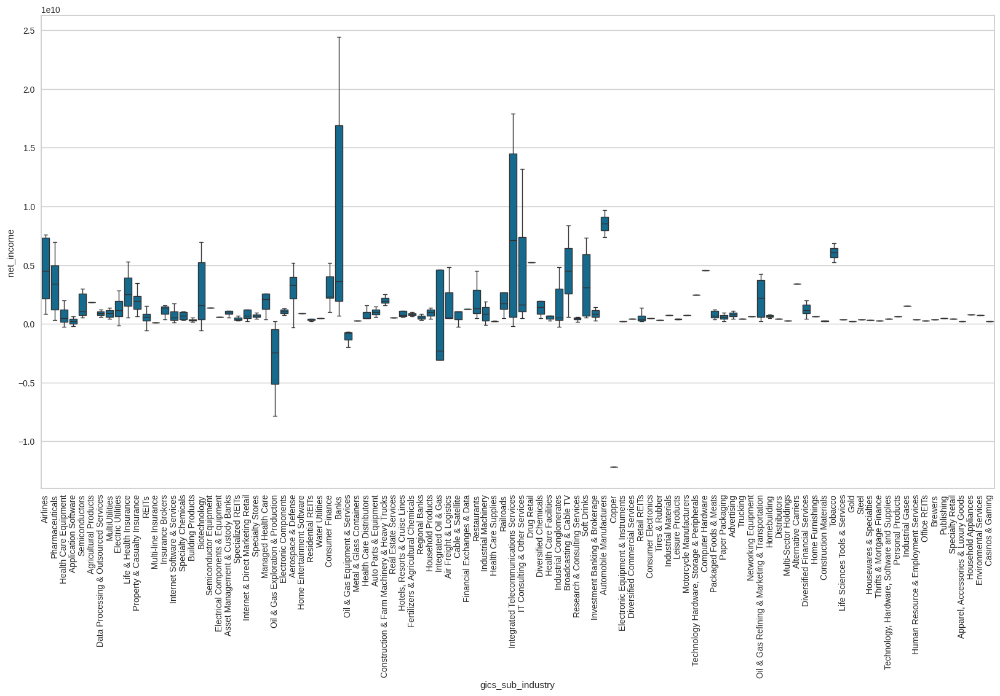

In [77]:
# boxplot for anlaysis of net income and Gics sub industry
plt.figure(figsize=(20,10))
sns.boxplot(data=data1,x='gics_sub_industry',y='net_income',showfliers=False) # turning off outliers
plt.xticks(rotation=90)
plt.show()

Alot of variation was observed in the net income for the Gics sub industry. There were significant ranges in median value and range values across the sub industry. Some sub industries recorded negative net income values.

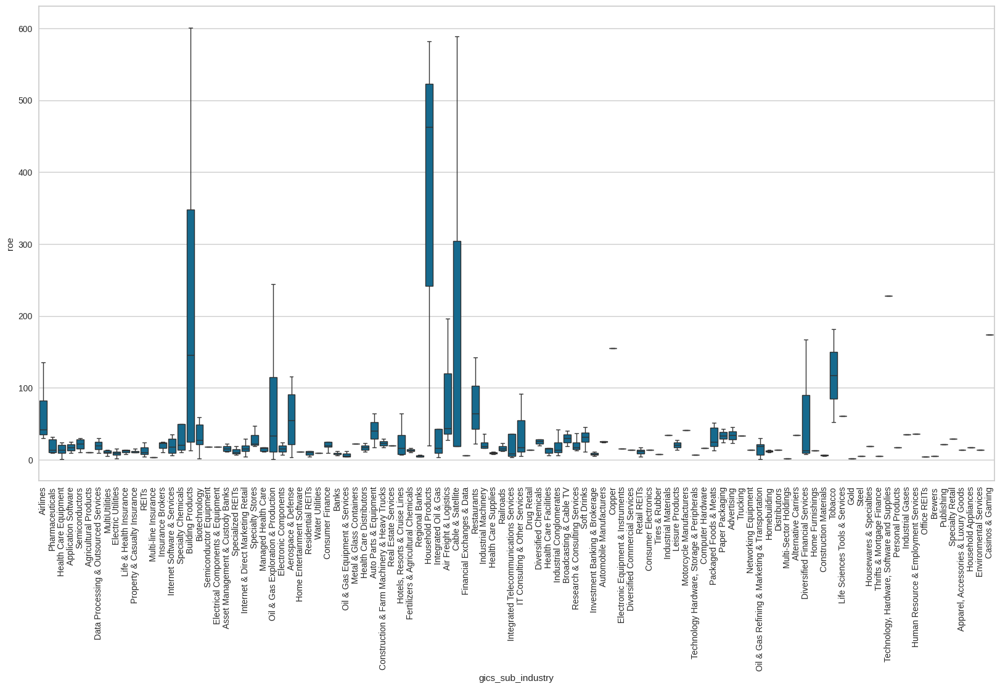

In [78]:
# boxplot for anlaysis of cuisine type and cost of the orders
plt.figure(figsize=(20,10))
sns.boxplot(data=data1,x='gics_sub_industry',y='roe',showfliers=False) # turning off outliers
plt.xticks(rotation=90)
plt.show()

Alot of variation was observed in the ROE for the Gics sub industry. There were significant ranges in median value and value ranges across the sub industry. Some sub industries recorded negative net income values.

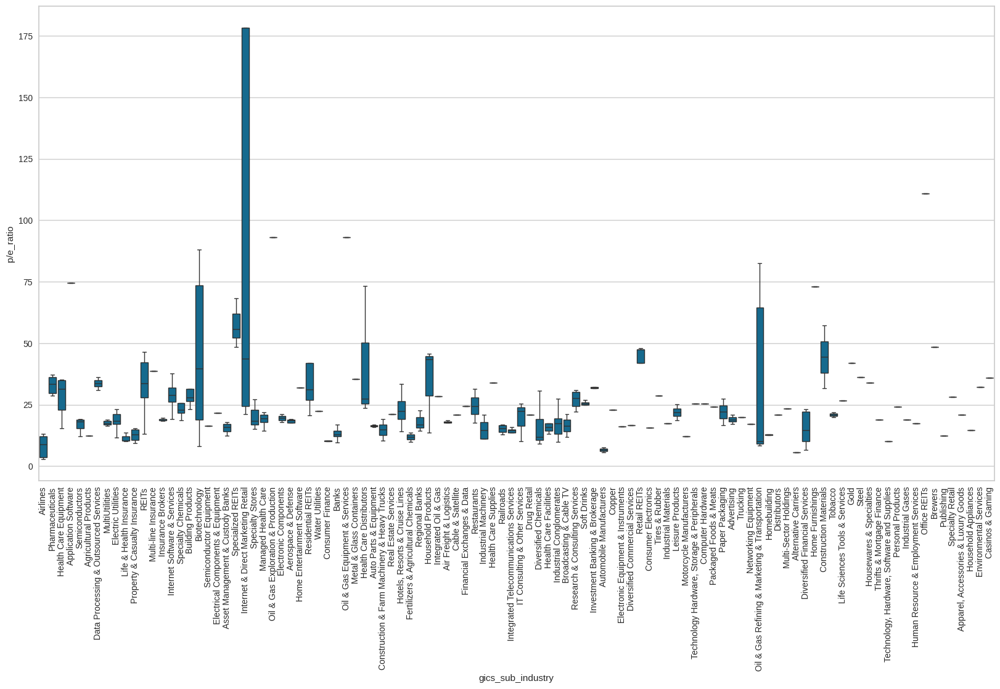

In [79]:
# boxplot for analysis of p/e ratio and Gics sub industry
plt.figure(figsize=(20,10))
sns.boxplot(data=data1,x='gics_sub_industry',y='p/e_ratio',showfliers=False) # turning off outliers
plt.xticks(rotation=90)
plt.show()

Alot of variation was observed in the P/E ratio for the Gics sub industry. There were significant ranges in median value and range values across the sub industry.

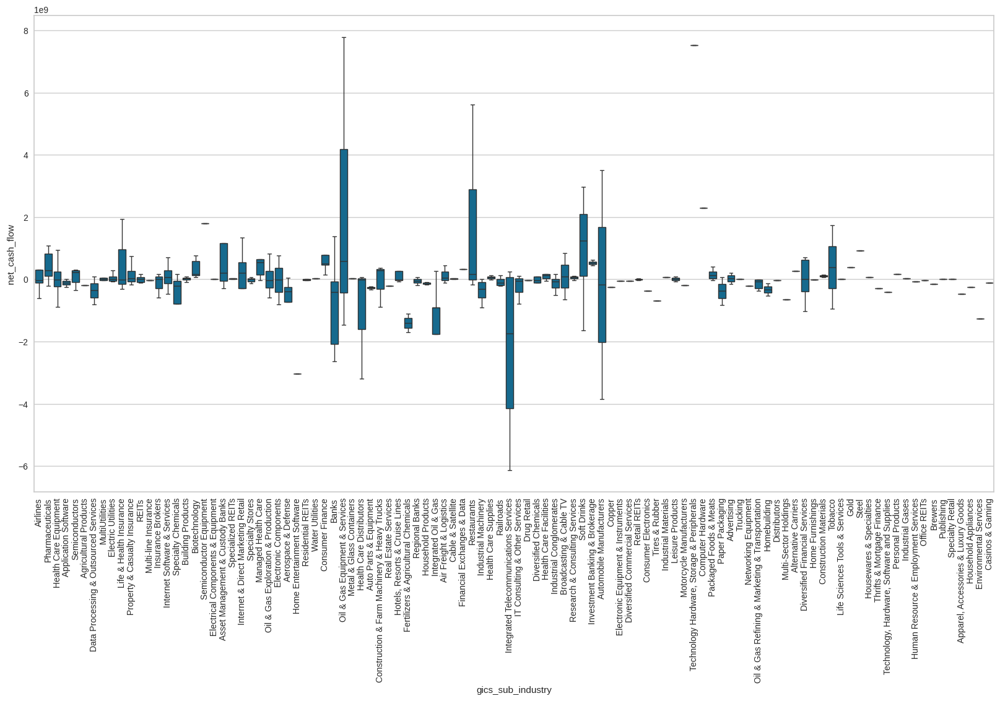

In [83]:
# boxplot for analysis of net cash flow type and cost of the orders
plt.figure(figsize=(20,10))
sns.boxplot(data=data1,x='gics_sub_industry',y='net_cash_flow',showfliers=False) # turning off outliers
plt.xticks(rotation=90)
plt.show()

Alot of variation was observed in the net cash flow for the Gics sub industry. There were significant ranges in median value and distribution range values across the sub industry. Some sub industries recorded negative net income values.

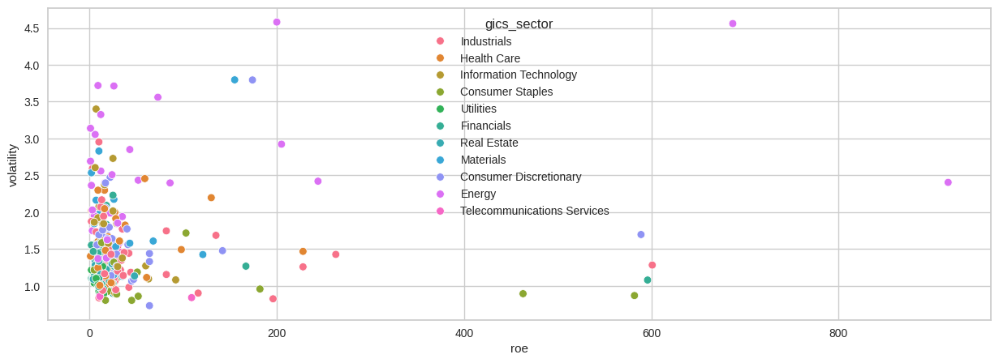

In [73]:
# scatter plot of volatility, ROE and Gics sector

plt.figure(figsize=(15,5))
sns.scatterplot(data=data1,x='roe',y='volatility', hue='gics_sector')
plt.show()

The distribution of volatility and ROE across the different economic sectors is indicated. There was independence in the observable distribution in the ROE and volatility across the economic sectors.

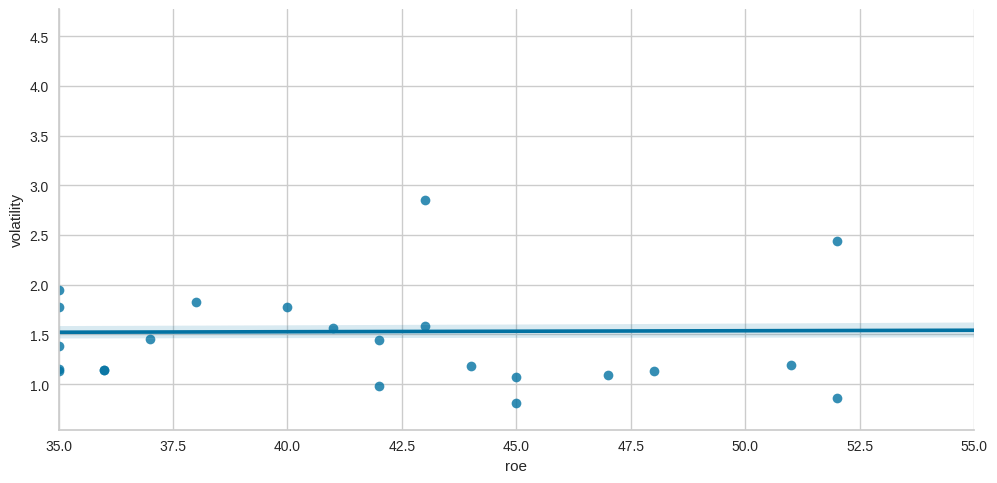

In [65]:
# line plot for ROE and volatility
sns.lmplot(data=data1,x='roe',y='volatility',height=5,aspect=2)
plt.xlim(35,55)
plt.show()

The lineplot for relation between volatility and ROE is indicated.

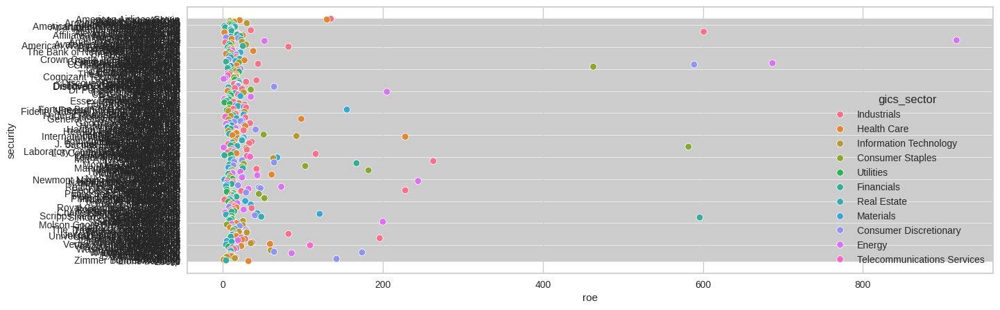

In [86]:
# scatter plot of security and ROE across the Gics sectors

plt.figure(figsize=(15,5))
sns.scatterplot(data=data1,x='roe',y='security', hue='gics_sector')
plt.show()

Distribution of ROE and security variables across the different Gics sectors is independent

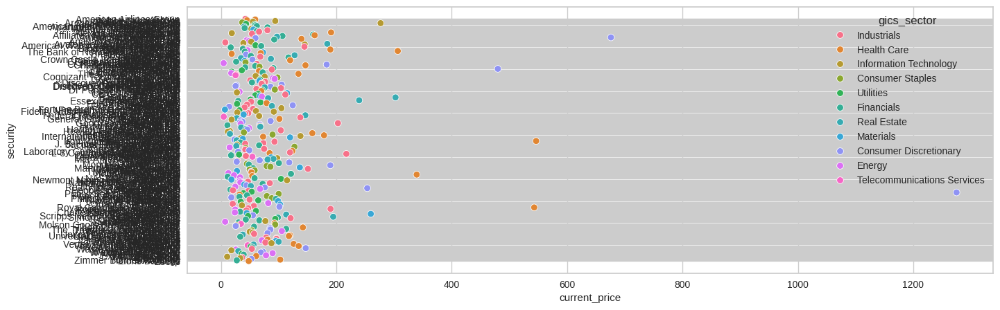

In [87]:
# scatter plot of current price and security across the Gics sectors

plt.figure(figsize=(15,5))
sns.scatterplot(data=data1,x='current_price',y='security', hue='gics_sector')
plt.show()

Distribution of current price and security variables across the different Gics sectors is independent

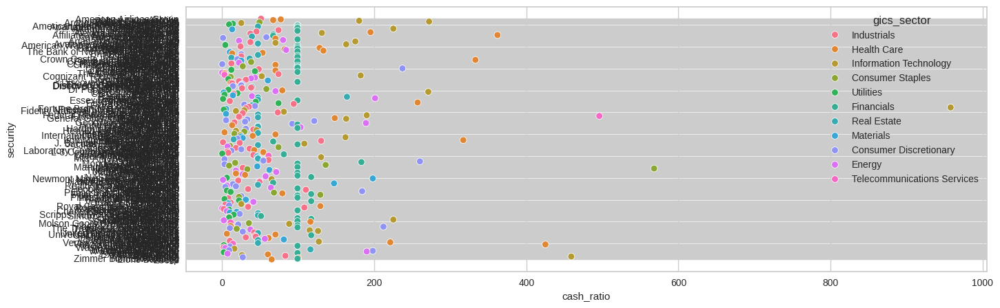

In [88]:
# scatter plot of cash ratio and security across Gics sectors

plt.figure(figsize=(15,5))
sns.scatterplot(data=data1,x='cash_ratio',y='security', hue='gics_sector')
plt.show()

Distribution of cash ratioand security variables across the different Gics sectors is independent

In [89]:
# creating a dataframe of numerical variables
num_col = ['current_price', 'price_change', 'volatility',
           'roe', 'cash_ratio', 'net_cash_flow', 'net_income', 'earnings_per_share', 'estimated_shares_outstanding',
           'p/e_ratio', 'p/b_ratio', 'earning_yields',	'Market Cap', 'Liquidity_ratio']

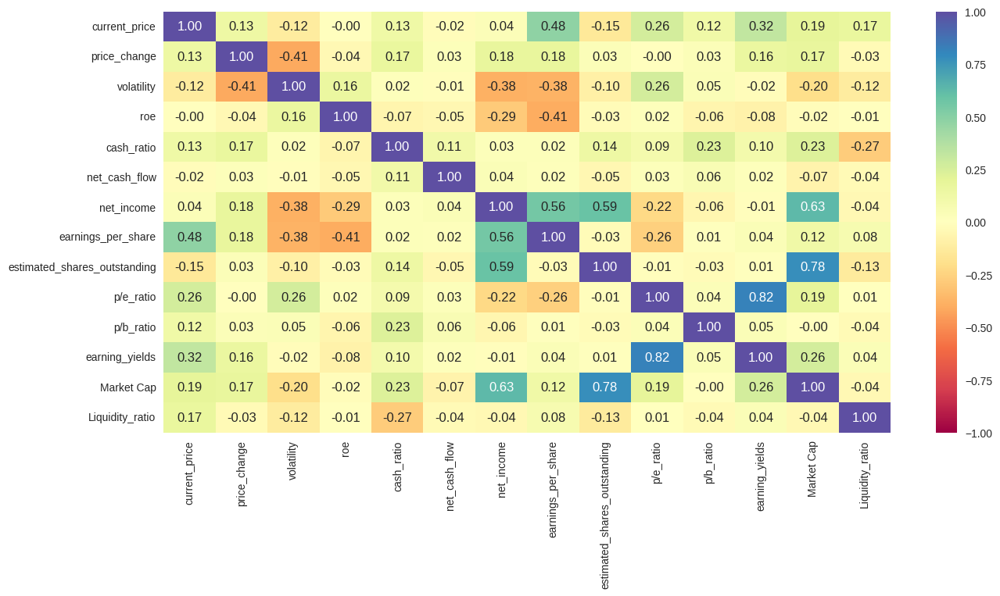

In [90]:
# correlation analysis of numerical variables

plt.figure(figsize=(15, 7))
sns.heatmap(data1[num_col].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

Most variables had low correlation indexes. Also low negative correlations were observed between variables. High correlations were observed between net income and ernings per share and stimated shares outstanding, also between current price and earnnings per share, amongst others. Earnings yield had low positive correlation with all other variables except a high positive correlation with p/e ratio and a negative correlation with ROE, volatility and net income. The liquity ratio variable had a negative correlation with all other variables except current price, earnings per share, p/e ratio and earnings yield. Market cap had low positive correlation with all other variables except a high positive correlation with estimated shares outstanding and a negative correlation with ROE, volatilityand liquidity ration, and no correlation with p/b ratio (0.00).

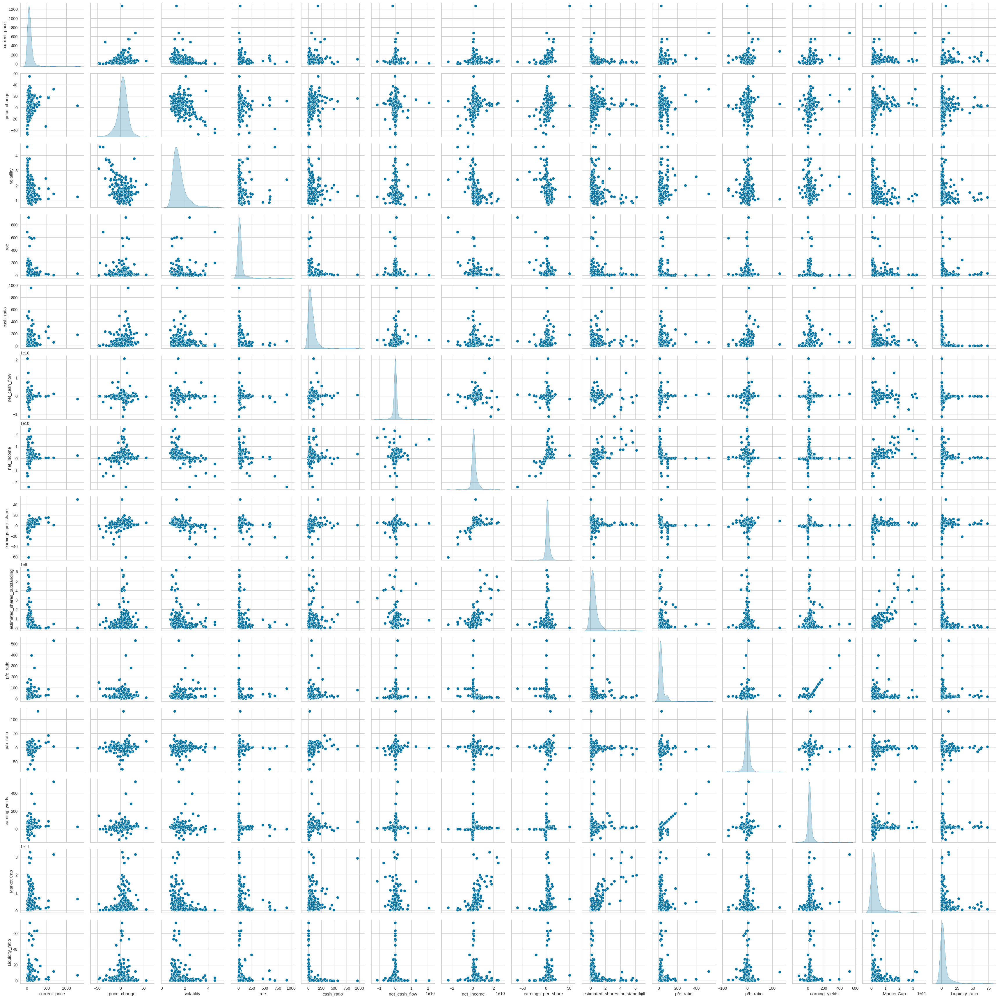

In [91]:
# Pairplot analysis of numerical variables
sns.pairplot(data=data1[num_col], diag_kind="kde")
plt.show()

The scatter plots of all variables are indicated. Most variable distributions do not display any relationship. Most variables seem to be independent of each other.

## Outlier check

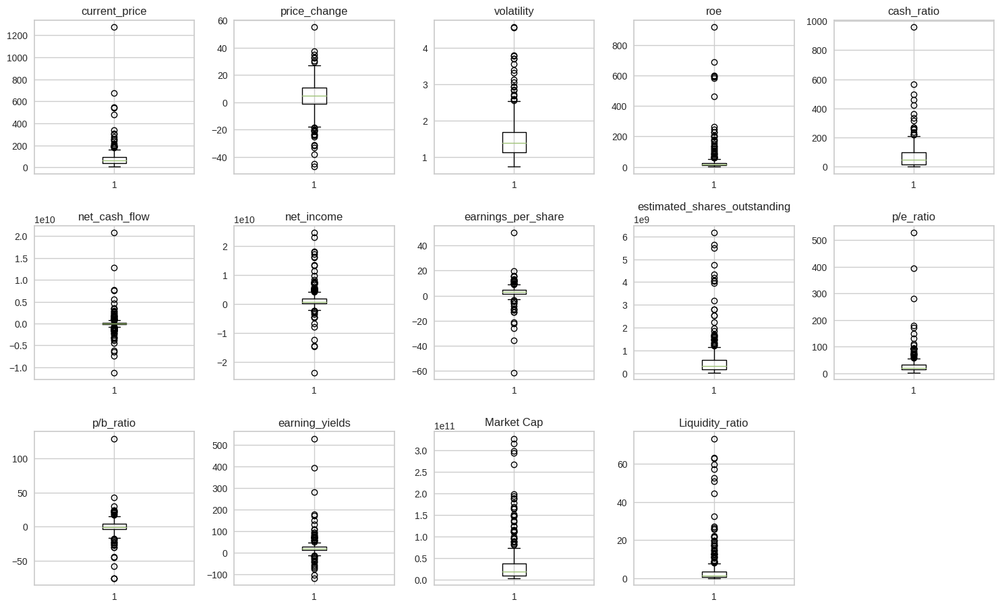

In [ ]:
# outlier check
plt.figure(figsize=(15, 12))

numeric_columns = data1.select_dtypes(include=np.number).columns.tolist()

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 5, i + 1)
    plt.boxplot(data1[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

All variables had outlier data with most having high numbers of high outlier values. However a few variables  including earning yields, p/b ratio, net cash flow, net income, earnings per share and price change had oulier values that were lower than average values.

# Scaling data

In [92]:
# dataframe containing numerical variables excluding engineered features
num_col1 = ['current_price', 'price_change', 'volatility',
           'roe', 'cash_ratio', 'net_cash_flow', 'net_income', 'earnings_per_share', 'estimated_shares_outstanding',
           'p/e_ratio', 'p/b_ratio']

In [93]:
# variables used for clustering
num_col1


['current_price',
 'price_change',
 'volatility',
 'roe',
 'cash_ratio',
 'net_cash_flow',
 'net_income',
 'earnings_per_share',
 'estimated_shares_outstanding',
 'p/e_ratio',
 'p/b_ratio']

Numerical variables in dataframe for clustering analysis

In [94]:
# Scaling the data set before clustering
scaler = StandardScaler()
subset = data1[num_col1].copy()
subset_scaled = scaler.fit_transform(subset)

In [95]:
# creating a dataframe of the scaled data
subset_scaled_df = pd.DataFrame(subset_scaled, columns=subset.columns)

A new dataframe has been created called subset scaled dataframe comprised of numerical variables of the original dataframe

In [96]:
# checking the first 5 rows of the sub set scaled dataframe
subset_scaled_df.head()

,current_price,price_change,volatility,roe,cash_ratio,net_cash_flow,net_income,earnings_per_share,estimated_shares_outstanding,p/e_ratio,p/b_ratio
0,-0.393341,0.493950,0.272749,0.989601,-0.210698,-0.339355,1.554415,1.309399,0.107863,-0.652487,-0.506653
1,-0.220837,0.355439,1.137045,0.937737,0.077269,-0.002335,0.927628,0.056755,1.250274,-0.311769,-0.504205
2,-0.367195,0.602479,-0.427007,-0.192905,-0.033488,0.454058,0.744371,0.024831,1.098021,-0.391502,0.094941
3,0.133567,0.825696,-0.284802,-0.317379,1.218059,-0.152497,-0.219816,-0.230563,-0.091622,0.947148,0.424333
4,-0.260874,-0.492636,0.296470,-0.265515,2.237018,0.133564,-0.202703,-0.374982,1.978399,3.293307,0.199196


from matplotlib import pyplot as plt
_df_0['current_price'].plot(kind='hist', bins=20, title='current_price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['price_change'].plot(kind='hist', bins=20, title='price_change')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['volatility'].plot(kind='hist', bins=20, title='volatility')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['roe'].plot(kind='hist', bins=20, title='roe')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='current_price', y='price_change', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='price_change', y='volatility', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='volatility', y='roe', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='roe', y='cash_ratio', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8['current_price'].plot(kind='line', figsize=(8, 4), title='current_price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_9['price_change'].plot(kind='line', figsize=(8, 4), title='price_change')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_10['volatility'].plot(kind='line', figsize=(8, 4), title='volatility')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_11['roe'].plot(kind='line', figsize=(8, 4), title='roe')
plt.gca().spines[['top', 'right']].set_visible(False)

The first 5 rows of the sub set scaled dataframe is as indicated above and all the data is now standardized.

# K-means Clustering

Checking Elbow Plot

In [99]:
# ccreating a copy of the subset scaled dataframe
k_means_df = subset_scaled_df.copy()

Number of Clusters: 1 	Average Distortion: 2.5425069919221697
Number of Clusters: 2 	Average Distortion: 2.382318498894466
Number of Clusters: 3 	Average Distortion: 2.2692367155390745
Number of Clusters: 4 	Average Distortion: 2.1745559827866363
Number of Clusters: 5 	Average Distortion: 2.128799332840716
Number of Clusters: 6 	Average Distortion: 2.080400099226289
Number of Clusters: 7 	Average Distortion: 2.0289794220177395
Number of Clusters: 8 	Average Distortion: 1.964144163389972
Number of Clusters: 9 	Average Distortion: 1.9221492045198068
Number of Clusters: 10 	Average Distortion: 1.8513913649973124
Number of Clusters: 11 	Average Distortion: 1.8024134734578485
Number of Clusters: 12 	Average Distortion: 1.7900931879652673
Number of Clusters: 13 	Average Distortion: 1.7417609203336912
Number of Clusters: 14 	Average Distortion: 1.673559857259703


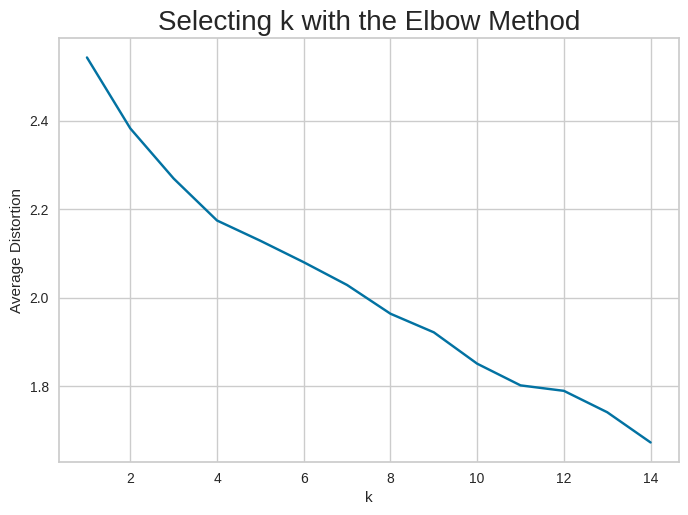

In [100]:
# creating clusters
clusters = range(1, 15)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(subset_scaled_df)
    prediction = model.predict(k_means_df)
    distortion = (
        sum(np.min(cdist(k_means_df, model.cluster_centers_, "euclidean"), axis=1))
        / k_means_df.shape[0]
    )

    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)

plt.plot(clusters, meanDistortions, "bx-")
plt.xlabel("k")
plt.ylabel("Average Distortion")
plt.title("Selecting k with the Elbow Method", fontsize=20)
plt.show()

Appropriate value for k seems to be 4

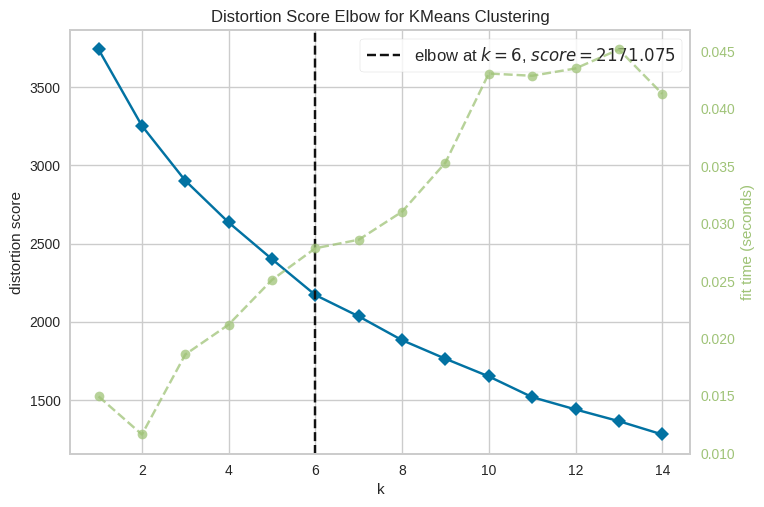

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [101]:
# Instantiate the KMeans model
model = KMeans()

# Instantiate the KElbowVisualizer with a range of K values
visualizer = KElbowVisualizer(model, k=(1, 15))

# Fit the visualizer to your data
visualizer.fit(k_means_df)

# Display the elbow plot
visualizer.show()

Appropriate distortion score of 5-6 seems ideal

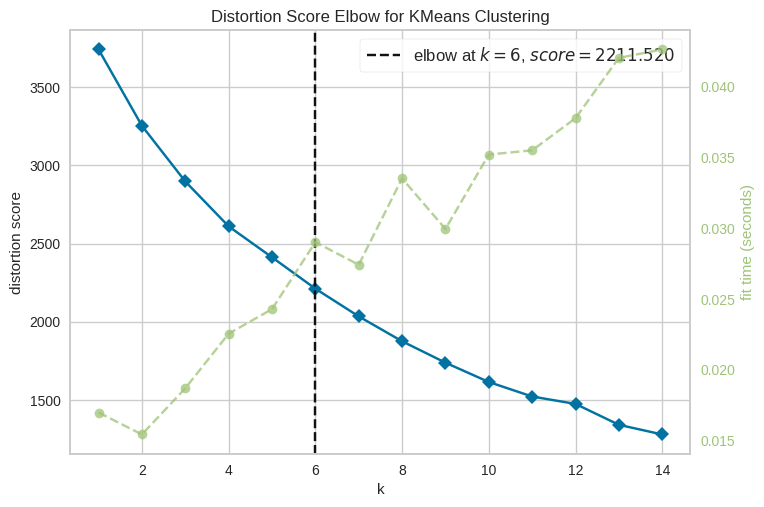

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [102]:
# # to fit the data to the visualizer, finalize and render figure
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(1, 15), timings=True)
visualizer.fit(k_means_df)
visualizer.show()

k=6 seems most appropriate

# checking the silhouette scores

For n_clusters = 2, the silhouette score is 0.43969639509980457)
For n_clusters = 3, the silhouette score is 0.4644405674779404)
For n_clusters = 4, the silhouette score is 0.4577225970476733)
For n_clusters = 5, the silhouette score is 0.43228336443659804)
For n_clusters = 6, the silhouette score is 0.4005422737213617)
For n_clusters = 7, the silhouette score is 0.3976335364987305)
For n_clusters = 8, the silhouette score is 0.40278401969450467)
For n_clusters = 9, the silhouette score is 0.3778585981433699)
For n_clusters = 10, the silhouette score is 0.13458938329968687)
For n_clusters = 11, the silhouette score is 0.1421832155528444)
For n_clusters = 12, the silhouette score is 0.2044669621527429)
For n_clusters = 13, the silhouette score is 0.23424874810104204)
For n_clusters = 14, the silhouette score is 0.12102526472829901)


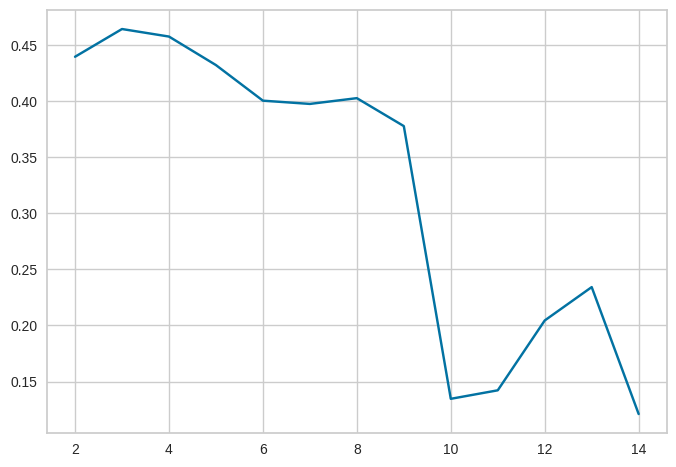

In [103]:
# computing Silhoutte scores
sil_score = []
cluster_list = range(2, 15)
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    preds = clusterer.fit_predict((subset_scaled_df))
    score = silhouette_score(k_means_df, preds)
    sil_score.append(score)
    print("For n_clusters = {}, the silhouette score is {})".format(n_clusters, score))

plt.plot(cluster_list, sil_score)
plt.show()

The best score is for n_clusters = 3, the silhouette score is 0.4644405674779404)

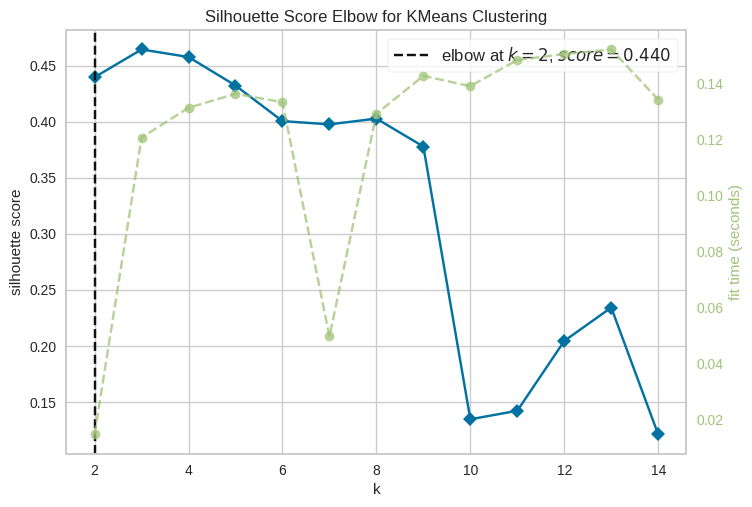

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [ ]:
# # fit the data to the visualizer, finalize and render figure
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2, 15), metric="silhouette", timings=True)
visualizer.fit(k_means_df)
visualizer.show()

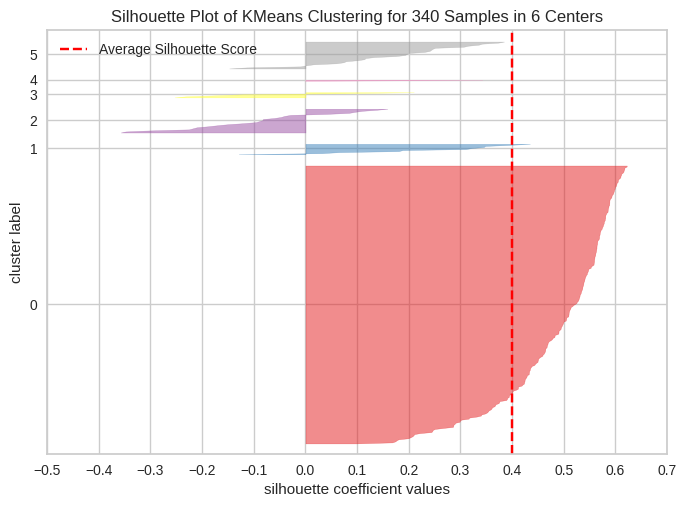

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [104]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(6, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

k=6 does not give a good representation of distinct clusters

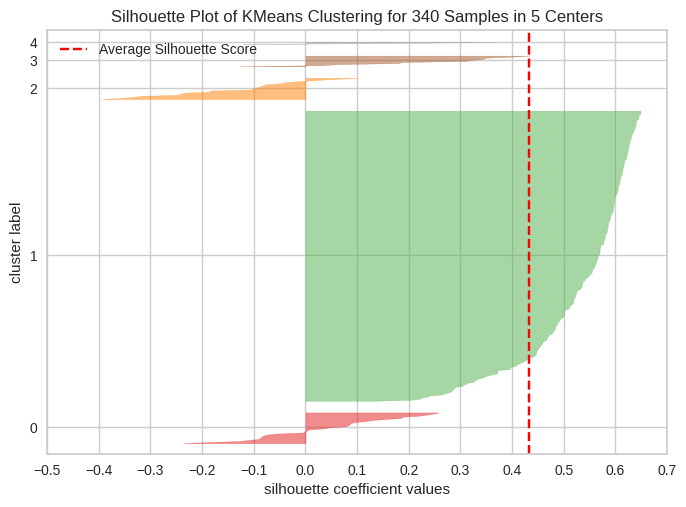

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [105]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(5, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

k=5 does not give a good representation of distinct clusters

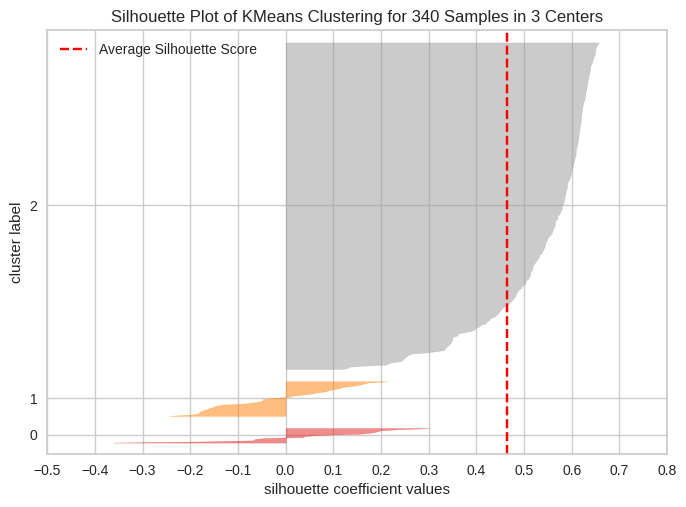

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [106]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(3, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

k=3 does renders the best representation of distinct clusters

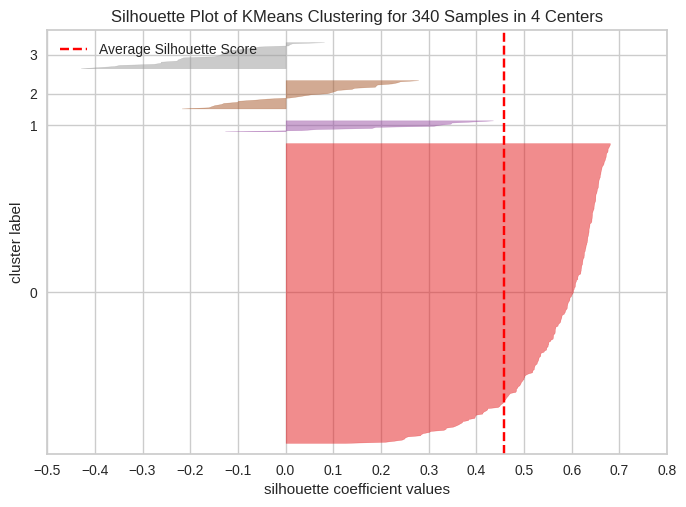

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [107]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

k=4 does give a good representation of distinct clusters compared to k= 5 and k=6 but not better than k=3

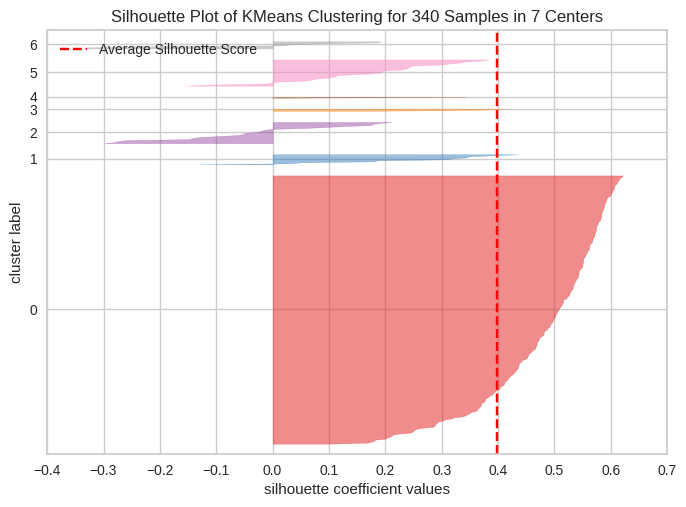

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 7 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [108]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(7, random_state=1))
visualizer.fit(subset_scaled_df)
visualizer.show()

k=7 does not give a good representation of distinct clusters

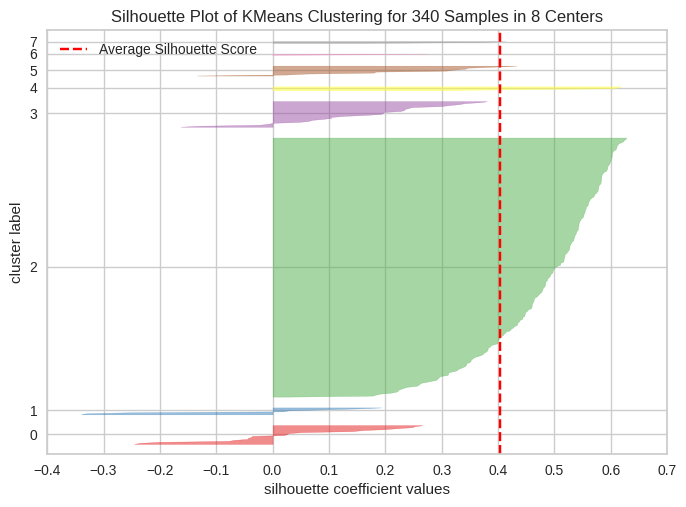

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 8 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [109]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(8, random_state=1))
visualizer.fit(subset_scaled_df)
visualizer.show()

k=8 does not give a good representation of distinct clusters

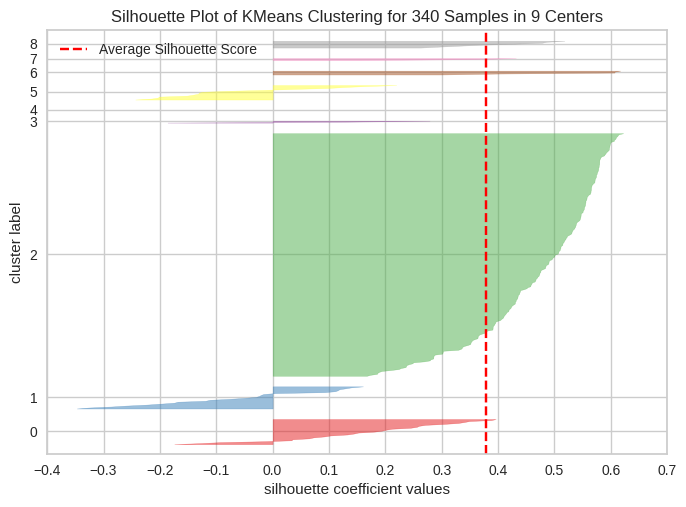

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 9 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [110]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(9, random_state=1))
visualizer.fit(subset_scaled_df)
visualizer.show()

k=9 does not give a good representation of distinct clusters

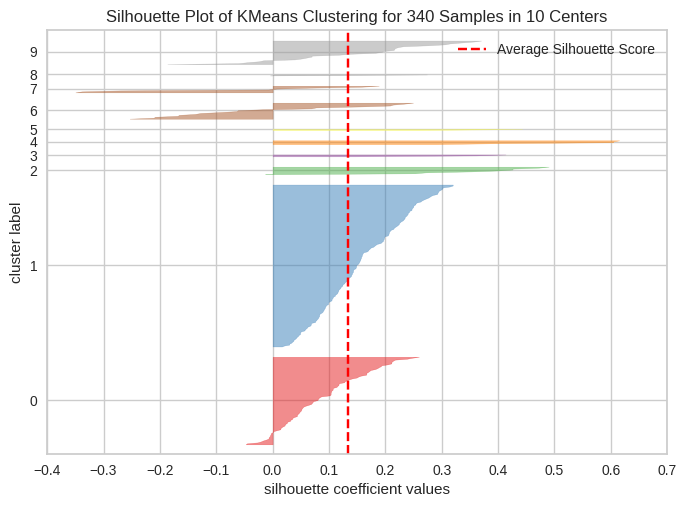

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 10 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [111]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(10, random_state=1))
visualizer.fit(subset_scaled_df)
visualizer.show()

k=10 does not give a good representation of distinct clusters

# Creating Final Model

In [112]:
# final K-means model for 3 clusters
kmeans = KMeans(n_clusters=3, random_state=0) ## Complete the code to choose the number of clusters
kmeans.fit(subset_scaled_df)

KMeans(n_clusters=3, random_state=0)

In [113]:
# adding kmeans cluster labels to the original and scaled dataframes

data1["K_means_segments"] = kmeans.labels_
subset_scaled_df["K_means_segments"] = kmeans.labels_

A new colum called K_means_segments has been added to the dataframe

In [114]:
# checking the first 5 rows of subset scaled dataset
subset_scaled_df.head()

,current_price,price_change,volatility,roe,cash_ratio,net_cash_flow,net_income,earnings_per_share,estimated_shares_outstanding,p/e_ratio,p/b_ratio,K_means_segments
0,-0.393341,0.493950,0.272749,0.989601,-0.210698,-0.339355,1.554415,1.309399,0.107863,-0.652487,-0.506653,0
1,-0.220837,0.355439,1.137045,0.937737,0.077269,-0.002335,0.927628,0.056755,1.250274,-0.311769,-0.504205,0
2,-0.367195,0.602479,-0.427007,-0.192905,-0.033488,0.454058,0.744371,0.024831,1.098021,-0.391502,0.094941,0
3,0.133567,0.825696,-0.284802,-0.317379,1.218059,-0.152497,-0.219816,-0.230563,-0.091622,0.947148,0.424333,0
4,-0.260874,-0.492636,0.296470,-0.265515,2.237018,0.133564,-0.202703,-0.374982,1.978399,3.293307,0.199196,2


The variable K_means_segments has been appended to the dataframe

In [115]:
# creating a new dataframe name with the K_means_segments column
cluster_profile = subset_scaled_df.groupby("K_means_segments").mean()

In [118]:
# grouping the subset scaled dataframe based on K_means_segments and current price
cluster_profile["count_in_each_segments"] = (
    subset_scaled_df.groupby("K_means_segments")["current_price"].count().values
)

A column labelled count_in_each_segments has been created in the dtaframe and indicates the number of rows od data in each specified cluster.

In [119]:
# to display cluster profiles
cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,current_price,price_change,volatility,roe,cash_ratio,net_cash_flow,net_income,earnings_per_share,estimated_shares_outstanding,p/e_ratio,p/b_ratio,count_in_each_segments
K_means_segments,,,,,,,,,,,,
0,0.034604,0.126536,-0.209602,-0.056535,-0.035529,-0.023049,-0.011384,0.171125,-0.178392,-0.185093,-0.021006,293
1,-0.293323,0.225363,-0.593683,-0.139559,0.776616,0.362618,3.018134,0.150899,3.861986,-0.270027,-0.129856,14
2,-0.182803,-1.219091,2.112878,0.561171,-0.014021,0.050810,-1.179347,-1.583402,-0.054513,1.757959,0.241601,33


3 clusters have been created. The total count of rows in cluster 0 is 293 while clusters 1 and 2 comprise 14 and 33 rows of data.

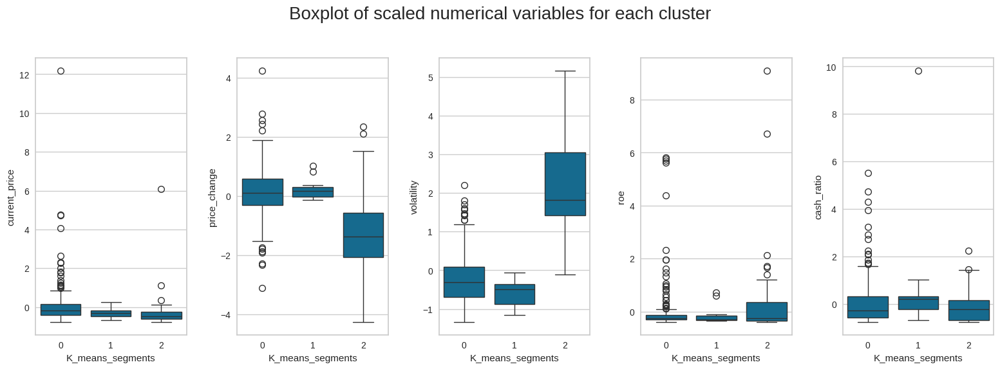

In [120]:
# creating boxplots of each cluster using scaled data
fig, axes = plt.subplots(1, 5, figsize=(16, 6))
fig.suptitle("Boxplot of scaled numerical variables for each cluster", fontsize=20)
counter = 0
for ii in range(5):
    sns.boxplot(
        ax=axes[ii],
        y=subset_scaled_df[num_col[counter]],
        x=subset_scaled_df["K_means_segments"],
    )
    counter = counter + 1

fig.tight_layout(pad=2.0)

The distribution of each variable for every cluster is indicated. The 3 clusters can be clearly distinguished with regard to each scaled data variable.

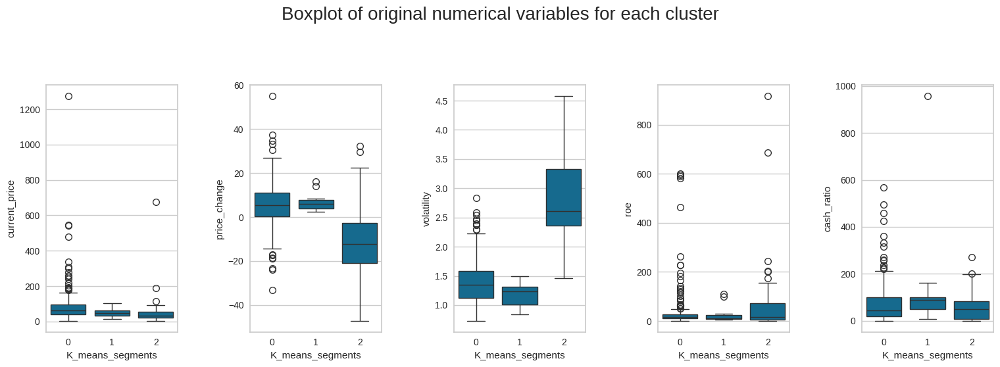

In [ ]:
# creating boxplots of each cluster using original data
fig, axes = plt.subplots(1, 5, figsize=(16, 6))
fig.suptitle("Boxplot of original numerical variables for each cluster", fontsize=20)
counter = 0
for ii in range(5):
    sns.boxplot(ax=axes[ii], y=data1[num_col[counter]], x=data1["K_means_segments"])
    counter = counter + 1

fig.tight_layout(pad=3.0)

The distribution of each variable for every cluster is indicated. The 3 clusters can be clearly distinguished with regard to each original data variable.

In [121]:
## To print the companies in each cluster
for cl in data1["K_means_segments"].unique():
    print("In cluster {}, the following companies are present:".format(cl))
    print(data1[data1["K_means_segments"] == cl]["security"].unique())
    print()

In cluster 0, the following companies are present:
['American Airlines Group' 'AbbVie' 'Abbott Laboratories'
 'Adobe Systems Inc' 'Archer-Daniels-Midland Co' 'Alliance Data Systems'
 'Ameren Corp' 'American Electric Power' 'AFLAC Inc'
 'American International Group, Inc.' 'Apartment Investment & Mgmt'
 'Assurant Inc' 'Arthur J. Gallagher & Co.' 'Akamai Technologies Inc'
 'Albemarle Corp' 'Alaska Air Group Inc' 'Allstate Corp' 'Allegion'
 'Applied Materials Inc' 'AMETEK Inc' 'Affiliated Managers Group Inc'
 'Amgen Inc' 'Ameriprise Financial' 'American Tower Corp A'
 'AutoNation Inc' 'Anthem Inc.' 'Aon plc' 'Amphenol Corp' 'Arconic Inc'
 'Activision Blizzard' 'AvalonBay Communities, Inc.' 'Broadcom'
 'American Water Works Company Inc' 'American Express Co' 'Boeing Company'
 'Baxter International Inc.' 'BB&T Corporation' 'Bard (C.R.) Inc.'
 'BIOGEN IDEC Inc.' 'The Bank of New York Mellon Corp.' 'Ball Corp'
 'Bristol-Myers Squibb' 'Boston Scientific' 'BorgWarner'
 'Boston Properties' 'Cate

The profile of company names within each cluster. Cluster 0 has the most number of companies followed by cluster 2 and last is cluster 1.

In [123]:
# grouping the clusters across the economic sectors (gics sector)
data1.groupby(["K_means_segments", "gics_sector"])['security'].count()

K_means_segments  gics_sector                
0                 Consumer Discretionary         37
                  Consumer Staples               18
                  Energy                          5
                  Financials                     45
                  Health Care                    36
                  Industrials                    52
                  Information Technology         27
                  Materials                      19
                  Real Estate                    27
                  Telecommunications Services     3
                  Utilities                      24
1                 Consumer Discretionary          1
                  Consumer Staples                1
                  Energy                          1
                  Financials                      4
                  Health Care                     3
                  Information Technology          2
                  Telecommunications Services     2
2                 

The list of economic sectors (gics sector) in each cluster group (cluster groups across Gics sector)

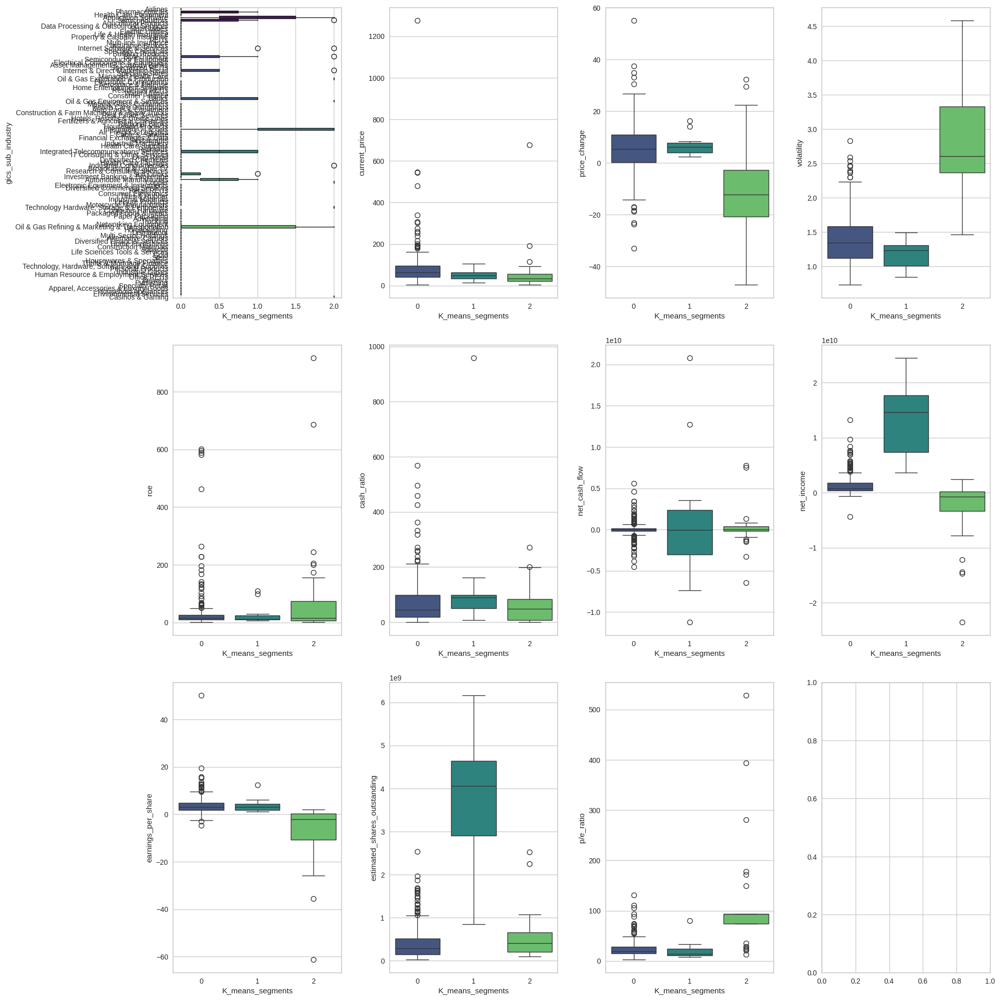

In [124]:
# boxplots of numerical variables for each K-Means cluster
fig, axes = plt.subplots(3, 4, figsize=(20, 20))
counter = 0

for ii in range(3):
    for jj in range(4):
        if counter < 11:
            sns.boxplot(
                ax=axes[ii][jj],
                data=data1,
                y=data1.columns[3+counter],
                x="K_means_segments",
                palette="viridis"
            )
            counter = counter + 1

fig.tight_layout(pad=2.0)

Cluster 0:
Comprises of the most number of entities. Has the highest current price of stocks. Contains both negative and positive outilers values in earnings per share. The cluster a positive earnings per share values. Lowest estimated shares outstanding with higher outlier values. Low P/E ratio with many positive outlier values. The cluster has ROE with very high number of positive outliers. Cash ratio is low and also has very many outlier values and high range of values. Net cash ratio range is the lowest with very many positive and negative outliers. The net income is low (just above 0) with a high range and very many outlier values.

Cluster 1:

This cluster contains stocks with medium median current price. It has stocks whose earnings share have positive outliers and a positive median value of earnings share. The stocks in this cluster also the highest median estimated shares outstanding and low P/E ratio. The ROE is low with low range of ROE values and a few outliers. This cluster has the highest median cash ratios which have low range values and a few outliers. The cluster has highest range in net cash flow which have no outliers. The cluster is characterised with high net income. The net income values have a large range.

Cluster 2:

The current price is the lowest. Earnings per share has negative outliers with below 0.0 median earnings per share. Earnings per share has a median value of below 0.0. Low estimated shares outstanding. High p?e ratio with both positive and negative outliers. High ROE but the ROE has a low value range with a few outliers. medium cash ratio. Low net cash flow which has low value range with a few outliers. Very low net income (in fact negative net income) with very many negative net income outliers.




# Insights


Cluster 0:
This cluster comprises the most number of entities which could represent a diverse group of stocks.
Current price: Stocks in this cluster have the highest current price. Investors might consider these stocks for long-term investment due to their strong performance.
Earnings per share: The presence of both negative and positive outliers suggests volatility. Investors should closely monitor these stocks and assess their financial stability.
Estimated shares outstanding: Despite having the lowest median estimated shares outstanding, some stocks exhibit higher outlier values. This could indicate potential growth opportunities.
P/E ratio: The low P/E ratio with positive outliers might attract value investors looking for undervalued stocks.
Return on equity (ROE): The very high number of positive outliers in ROE indicates exceptional performance by certain stocks.
Cash ratio: The low cash ratio and numerous outlier values suggest liquidity challenges. Companies in this cluster may need to manage their cash flow effectively.
Net cash ratio: The wide range of net cash ratio values (including both positive and negative outliers) implies varying financial health.
Net income: Despite low median net income, the large range and numerous outliers indicate diverse financial situations.

Cluster 1:
Current price: Stocks in this cluster have a medium median current price. They may appeal to investors seeking stability.
Earnings per share: Positive outliers in EPS suggest strong performance by certain stocks. The positive median value reinforces this.
Estimated shares outstanding: The highest median estimated shares outstanding indicates larger market capitalization.
P/E ratio: Low P/E ratio could attract value investors, but the narrow range suggests consistency.
ROE: While the ROE range is low, a few outliers indicate potential winners.
Cash ratios: The highest median cash ratios imply better liquidity.
Net cash flow: The wide range (without outliers) suggests stable financial operations.
Net income: High net income values indicate profitability.

Cluster 2
Current price: Stocks in Cluster 2 have the lowest current price. Investors seeking affordable entry points might find these stocks interesting.
Earnings per share: The presence of negative outliers indicates volatility or financial challenges. The median EPS being below 0.0 suggests that most stocks in this cluster are not profitable on a per-share basis.
Estimated shares outstanding: The low estimated shares outstanding imply a smaller market capitalization for these stocks.
P/E ratio: The high P/E ratio (with both positive and negative outliers) is intriguing. Investors should investigate why some stocks have unusually high or low ratios.
Return on equity (ROE): Despite a high ROE, the narrow value range and few outliers suggest consistency. Some stocks may be exceptionally efficient in generating profits relative to equity.
Cash ratio: The medium cash ratio indicates moderate liquidity.
Companies in this cluster may need to manage their cash position effectively.
Net cash flow: The low net cash flow (with a narrow value range and a few outliers) suggests stable financial operations. Investors should assess whether this aligns with their risk tolerance.
Net income: The very low net income (including negative values) indicates overall financial challenges. Numerous negative net income outliers highlight potential risks.




In [127]:
# clustering based on security
pd.crosstab(data1.K_means_segments, data1.security).style.highlight_max(
    color="lightgreen", axis=0
)

security,3M Company,AFLAC Inc,AMETEK Inc,AT&T Inc,AbbVie,Abbott Laboratories,Activision Blizzard,Adobe Systems Inc,Affiliated Managers Group Inc,Akamai Technologies Inc,Alaska Air Group Inc,Albemarle Corp,Alexion Pharmaceuticals,Allegion,Alliance Data Systems,Alliant Energy Corp,Allstate Corp,Altria Group Inc,Amazon.com Inc,Ameren Corp,American Airlines Group,American Electric Power,American Express Co,"American International Group, Inc.",American Tower Corp A,American Water Works Company Inc,Ameriprise Financial,Amgen Inc,Amphenol Corp,Anadarko Petroleum Corp,"Analog Devices, Inc.",Anthem Inc.,Aon plc,Apache Corporation,Apartment Investment & Mgmt,Applied Materials Inc,Archer-Daniels-Midland Co,Arconic Inc,Arthur J. Gallagher & Co.,Assurant Inc,AutoNation Inc,"AvalonBay Communities, Inc.",BB&T Corporation,BIOGEN IDEC Inc.,Baker Hughes Inc,Ball Corp,Bank of America Corp,Bard (C.R.) Inc.,Baxter International Inc.,Boeing Company,BorgWarner,Boston Properties,Boston Scientific,Bristol-Myers Squibb,Broadcom,C. H. Robinson Worldwide,CBRE Group,CF Industries Holdings Inc,CIGNA Corp.,CME Group Inc.,CMS Energy,CSX Corp.,CVS Health,Cabot Oil & Gas,Capital One Financial,Carnival Corp.,Caterpillar Inc.,Celgene Corp.,Centene Corporation,CenterPoint Energy,CenturyLink Inc,Charles Schwab Corporation,Charter Communications,Chesapeake Energy,Chevron Corp.,Chipotle Mexican Grill,Chubb Limited,Church & Dwight,Cimarex Energy,Cincinnati Financial,Citigroup Inc.,Citizens Financial Group,Citrix Systems,Coca Cola Company,Cognizant Technology Solutions,Colgate-Palmolive,Comerica Inc.,Concho Resources,Consolidated Edison,Corning Inc.,Crown Castle International Corp.,Cummins Inc.,DaVita Inc.,Danaher Corp.,Deere & Co.,Delphi Automotive,Delta Air Lines,Dentsply Sirona,Devon Energy Corp.,Digital Realty Trust,Discover Financial Services,Discovery Communications-A,Discovery Communications-C,Dominion Resources,Dover Corp.,Dr Pepper Snapple Group,Du Pont (E.I.),Duke Energy,Dun & Bradstreet,E*Trade,EOG Resources,EQT Corporation,Eastman Chemical,Eaton Corporation,Ecolab Inc.,Edison Int'l,Edwards Lifesciences,Entergy Corp.,Equifax Inc.,Equinix,Equity Residential,"Essex Property Trust, Inc.",Eversource Energy,Exelon Corp.,Expedia Inc.,Expeditors Int'l,Extra Space Storage,Exxon Mobil Corp.,FLIR Systems,FMC Corporation,Facebook,Fastenal Co,Federal Realty Investment Trust,Fidelity National Information Services,First Solar Inc,FirstEnergy Corp,Fiserv Inc,Flowserve Corporation,Fluor Corp.,Ford Motor,Fortune Brands Home & Security,Freeport-McMoran Cp & Gld,Frontier Communications,Garmin Ltd.,General Dynamics,General Growth Properties Inc.,General Motors,Genuine Parts,Gilead Sciences,Goodyear Tire & Rubber,Grainger (W.W.) Inc.,HCA Holdings,HCP Inc.,HP Inc.,Halliburton Co.,Harley-Davidson,Hartford Financial Svc.Gp.,Hasbro Inc.,Henry Schein,Hess Corporation,Hewlett Packard Enterprise,Honeywell Int'l Inc.,Hormel Foods Corp.,Host Hotels & Resorts,Humana Inc.,Huntington Bancshares,IDEXX Laboratories,Illinois Tool Works,Intel Corp.,International Business Machines,International Paper,Interpublic Group,Intl Flavors & Fragrances,Intuitive Surgical Inc.,Invesco Ltd.,Iron Mountain Incorporated,J. B. Hunt Transport Services,JPMorgan Chase & Co.,Jacobs Engineering Group,Juniper Networks,Kansas City Southern,Kimberly-Clark,Kimco Realty,Kinder Morgan,L-3 Communications Holdings,LKQ Corporation,Laboratory Corp. of America Holding,Leggett & Platt,Lennar Corp.,Leucadia National Corp.,Level 3 Communications,Lilly (Eli) & Co.,Lockheed Martin Corp.,LyondellBasell,M&T Bank Corp.,Macerich,Marathon Oil Corp.,Marathon Petroleum,Marriott Int'l.,Marsh & McLennan,Martin Marietta Materials,Masco Corp.,Mastercard Inc.,Mattel Inc.,McCormick & Co.,McDonald's Corp.,Mead Johnson,Merck & Co.,MetLife Inc.,Mettler Toledo,Mid-America Apartments,Mohawk Industries,Molson Coors Brewing Company,Mondelez International,Monster Beverage,Moody's Corp,Murphy Oil,Mylan N.V.,NASDAQ OMX Group,National Oilwell Varco Inc.

On the basis of security, very many companies belonged to cluster 1

In [128]:
# clustering based on gics sector
pd.crosstab(data1.K_means_segments, data1.gics_sector).style.highlight_max(
    color="lightgreen", axis=0
)

gics_sector,Consumer Discretionary,Consumer Staples,Energy,Financials,Health Care,Industrials,Information Technology,Materials,Real Estate,Telecommunications Services,Utilities
K_means_segments,,,,,,,,,,,
0,37,18,5,45,36,52,27,19,27,3,24
1,1,1,1,4,3,0,2,0,0,2,0
2,2,0,24,0,1,1,4,1,0,0,0


The displayed grouping is based on gics sector Most economic sectors were in cluster 0

In [130]:
# clustering based on current price
pd.crosstab(data1.K_means_segments, data1.current_price).style.highlight_max(
    color="lightgreen", axis=0
)

current_price,4.500000,4.670000,6.770000,7.110000,7.398807,10.630000,11.060000,11.450000,11.840000,12.590000,14.090000,14.920000,15.200000,15.340000,16.150000,16.830000,17.389999,17.690001,17.820000,17.910000,17.990000,18.280001,18.360001,18.440001,18.670000,20.250000,20.650000,22.450001,23.280001,23.940001,24.610001,24.660000,25.160000,25.219999,25.520000,25.700001,25.950001,26.190001,26.420000,26.459999,26.680000,27.010000,27.170000,27.209999,27.299999,27.480000,27.590000,27.600000,27.770000,28.070000,28.299999,29.629999,29.639999,29.980000,30.410000,31.225001,31.730000,31.799999,32.000000,32.279999,32.560001,32.669998,32.930000,33.259998,33.290001,33.480000,33.490002,34.009998,34.040001,34.130001,34.410000,34.450001,34.580002,34.826959,35.910000,36.080002,36.200001,36.500000,36.680000,37.169998,37.570000,37.700001,37.810001,38.150002,38.689999,38.709999,39.130001,39.180000,39.540001,40.029999,40.299999,40.810001,40.820000,40.939999,41.220001,41.830002,41.950001,42.020000,42.080002,42.349998,42.439999,42.840000,42.959999,43.060001,43.230000,43.459999,43.990002,44.080002,44.470001,44.599998,44.840000,44.910000,44.980000,45.099998,45.389999,46.150002,46.220001,46.599998,46.790001,47.139999,47.220001,47.400002,47.919998,48.209999,48.480000,48.580002,48.910000,49.529999,49.653332,49.799999,50.689999,51.070000,51.310001,51.630001,51.750000,51.840000,52.040001,52.130001,52.230000,52.516175,52.630001,52.820000,53.189999,53.330002,53.369999,53.590000,53.619999,54.070000,54.360001,54.480000,54.810001,55.209999,55.320000,55.450001,55.500000,56.009998,56.430000,56.830002,57.160000,57.299999,58.169998,58.209999,58.270000,59.169998,59.209999,59.240002,59.660000,59.750000,59.900002,60.020000,60.490002,60.599998,60.849998,61.310001,61.970001,62.020000,62.090000,64.269997,64.480003,65.809998,65.919998,65.989998,66.029999,66.360001,66.599998,66.620003,67.040001,67.360001,67.510002,67.610001,67.629997,67.639999,67.959999,68.029999,68.360001,68.790001,69.190002,69.550003,69.709999,70.416985,70.709999,70.790001,71.139999,71.389999,72.089996,72.180000,72.650002,72.730003,72.919998,73.360001,74.669998,75.620003,75.650002,75.660004,76.269997,76.830002,76.879997,77.949997,78.199997,78.949997,78.980003,79.410004,80.510002,80.540001,80.610001,80.690002,80.800003,81.410004,81.589996,81.800003,84.260002,84.589996,85.250000,85.500000,85.559998,85.730003,85.889999,86.449997,86.900002,87.360001,87.910004,88.010002,88.209999,89.269997,89.379997,89.959999,90.599998,90.809998,91.459999,92.209999,92.680000,92.860001,92.940002,93.199997,93.919998,93.940002,94.010002,94.970001,95.309998,96.070000,96.230003,96.949997,97.360001,97.769997,98.580002,98.820000,99.919998,99.959999,100.339996,101.190002,101.209999,102.400002,102.589996,103.570000,103.889999,103.930000,104.660004,105.080002,105.370003,106.419998,111.370003,112.860001,112.980003,114.379997,116.849998,117.639999,118.139999,119.489998,119.510002,119.639999,119.760002,120.599998,121.180000,123.639999,124.300003,125.830002,127.300003,127.540001,134.199997,134.580002,136.580002,137.360001,137.619995,139.440002,141.850006,144.589996,145.149994,146.100006,146.330002,146.869995,150.639999,158.190002,159.759995,162.330002,178.509995,183.100006,184.130005,189.389999,189.440002,189.789993,190.750000,194.440002,202.589996,217.149994,239.410004,253.419998,259.600006,276.570007,302.399994,306.350006,339.130005,479.850006,542.869995,546.159973,675.890015,1274.949951
K_means_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,1,0,0,1,1,1,1,1,0,0,0,0,1,1,0,1,0,1,1,1,1,1,1,1,0,1,0,1,0,0,0,1,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,1,1,1,1,0,1,0,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1

Clustering based on current price

In [132]:
# clustering with regard to GICS Sub Industry
pd.crosstab(data1.K_means_segments, data1.gics_sub_industry).style.highlight_max(
    color="lightgreen", axis=0
)

gics_sub_industry,Advertising,Aerospace & Defense,Agricultural Products,Air Freight & Logistics,Airlines,Alternative Carriers,"Apparel, Accessories & Luxury Goods",Application Software,Asset Management & Custody Banks,Auto Parts & Equipment,Automobile Manufacturers,Banks,Biotechnology,Brewers,Broadcasting & Cable TV,Building Products,Cable & Satellite,Casinos & Gaming,Computer Hardware,Construction & Farm Machinery & Heavy Trucks,Construction Materials,Consumer Electronics,Consumer Finance,Copper,Data Processing & Outsourced Services,Distributors,Diversified Chemicals,Diversified Commercial Services,Diversified Financial Services,Drug Retail,Electric Utilities,Electrical Components & Equipment,Electronic Components,Electronic Equipment & Instruments,Environmental Services,Fertilizers & Agricultural Chemicals,Financial Exchanges & Data,Gold,Health Care Distributors,Health Care Equipment,Health Care Facilities,Health Care Supplies,Home Entertainment Software,Home Furnishings,Homebuilding,"Hotels, Resorts & Cruise Lines",Household Appliances,Household Products,Housewares & Specialties,Human Resource & Employment Services,IT Consulting & Other Services,Industrial Conglomerates,Industrial Gases,Industrial Machinery,Industrial Materials,Insurance Brokers,Integrated Oil & Gas,Integrated Telecommunications Services,Internet & Direct Marketing Retail,Internet Software & Services,Investment Banking & Brokerage,Leisure Products,Life & Health Insurance,Life Sciences Tools & Services,Managed Health Care,Metal & Glass Containers,Motorcycle Manufacturers,Multi-Sector Holdings,Multi-line Insurance,MultiUtilities,Networking Equipment,Office REITs,Oil & Gas Equipment & Services,Oil & Gas Exploration & Production,Oil & Gas Refining & Marketing & Transportation,Packaged Foods & Meats,Paper Packaging,Personal Products,Pharmaceuticals,Property & Casualty Insurance,Publishing,REITs,Railroads,Real Estate Services,Regional Banks,Research & Consulting Services,Residential REITs,Restaurants,Retail REITs,Semiconductor Equipment,Semiconductors,Soft Drinks,Specialized REITs,Specialty Chemicals,Specialty Retail,Specialty Stores,Steel,"Technology Hardware, Storage & Peripherals","Technology, Hardware, Software and Supplies",Thrifts & Mortgage Finance,Tires & Rubber,Tobacco,Trucking,Water Utilities
K_means_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2,4,1,3,5,1,1,1,4,2,1,6,5,1,2,4,3,0,1,3,2,1,5,0,2,1,5,1,7,1,12,1,2,1,1,2,1,1,3,11,5,2,1,1,2,4,1,3,1,1,3,13,1,5,1,3,1,2,3,10,2,2,3,1,5,1,1,1,1,11,1,1,0,0,4,6,2,1,4,8,1,14,4,1,3,4,4,3,4,1,4,3,3,4,1,3,1,0,1,1,1,2,1,1
1,0,0,0,0,0,0,0,0,0,0,1,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,3,16,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0


Clustering based on GIcs sub industry

# Business Recommendations

Cluster 0:
- Diversify investments within this cluster to mitigate risk.
- Investigate stocks with positive EPS outliers for growth potential.
- Monitor liquidity and manage cash flow carefully.
- Consider the risk-reward trade-off when evaluating stocks with extreme net income values.

Cluster 1:
- Consider these stocks for a balanced portfolio.
- Explore stocks with positive EPS outliers for growth.
- Evaluate liquidity and financial stability.
- Assess net income trends and sustainability.


Cluster 2:
- Approach stocks in this cluster with caution due to their low profitability and financial instability.
- Investigate the reasons behind the negative net income and explore turnaround strategies.
- Consider diversifying investments across other clusters for risk management




## Hierarchical Clustering

### Computing Cophenetic Correlation

In [133]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to perform PCA
from sklearn.decomposition import PCA

# to suppress warnings
import warnings

warnings.filterwarnings("ignore")

In [135]:
# creating a copy of the subset scaled dataframe for hierarchical clustering
hc_df = subset_scaled_df.copy()
hc_df

,current_price,price_change,volatility,roe,cash_ratio,net_cash_flow,net_income,earnings_per_share,estimated_shares_outstanding,p/e_ratio,p/b_ratio,K_means_segments
0,-0.393341,0.493950,0.272749,0.989601,-0.210698,-0.339355,1.554415,1.309399,0.107863,-0.652487,-0.506653,0
1,-0.220837,0.355439,1.137045,0.937737,0.077269,-0.002335,0.927628,0.056755,1.250274,-0.311769,-0.504205,0
2,-0.367195,0.602479,-0.427007,-0.192905,-0.033488,0.454058,0.744371,0.024831,1.098021,-0.391502,0.094941,0
3,0.133567,0.825696,-0.284802,-0.317379,1.218059,-0.152497,-0.219816,-0.230563,-0.091622,0.947148,0.424333,0
4,-0.260874,-0.492636,0.296470,-0.265515,2.237018,0.133564,-0.202703,-0.374982,1.978399,3.293307,0.199196,2
...,...,...,...,...,...,...,...,...,...,...,...,...
335,-0.486181,0.901646,0.540121,-0.255142,4.308162,-0.559673,-1.487784,-1.127481,0.429111,-0.082116,0.572194,0
336,-0.289510,-1.065766,-0.079703,1.062211,-0.476513,0.053235,-0.051186,0.029391,-0.167741,-0.337154,-0.152012,0
337,0.221913,0.439539,-0.206067,-0.400362,0.332009,0.164889,-0.342467,-0.303532,-0.460058,2.233634,-1.589390,0
338,-0.547053,-0.436811,-0.097813,-0.369243,0.320933,-0.051022,-0.301171,-0.239684,-0.377852,-0.222714,0.118680,0


The first and last rows of the dataset

### exploring different linkage methods with Euclidean distance only.

In [136]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(subset_scaled_df, metric=dm, method=lm)
        c, coph_dists = cophenet(Z, pdist(subset_scaled_df))
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print('*'*100)
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Cophenetic correlation for Euclidean distance and single linkage is 0.9256256322762785.
Cophenetic correlation for Euclidean distance and complete linkage is 0.868928166968695.
Cophenetic correlation for Euclidean distance and average linkage is 0.9507555560579792.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.8783499263251745.
Cophenetic correlation for Chebyshev distance and single linkage is 0.9085319970035955.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.8284480418954171.
Cophenetic correlation for Chebyshev distance and average linkage is 0.9335782662323194.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.8888410614447411.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.925289715076201.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.7793043150338126.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.9383702428966993.
Cophenetic corr

Highest cophenetic correlation is 0.9507555560579792, which is obtained with Euclidean distance and average linkage. The second is Mahalanobis distance and average linkage is 0.9383702428966993.

### different linkage methods with Euclidean distance only

In [137]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for lm in linkage_methods:
    Z = linkage(subset_scaled_df, metric="euclidean", method=lm)
    c, coph_dists = cophenet(Z, pdist(subset_scaled_df))
    print("Cophenetic correlation for {} linkage is {}.".format(lm, c))
    if high_cophenet_corr < c:
        high_cophenet_corr = c
        high_dm_lm[0] = "euclidean"
        high_dm_lm[1] = lm

# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print('*'*100)
print(
    "Highest cophenetic correlation is {}, which is obtained with {} linkage.".format(
        high_cophenet_corr, high_dm_lm[1]
    )
)

Cophenetic correlation for single linkage is 0.9256256322762785.
Cophenetic correlation for complete linkage is 0.868928166968695.
Cophenetic correlation for average linkage is 0.9507555560579792.
Cophenetic correlation for centroid linkage is 0.9437005216488913.
Cophenetic correlation for ward linkage is 0.7069137712704721.
Cophenetic correlation for weighted linkage is 0.8783499263251745.
****************************************************************************************************
Highest cophenetic correlation is 0.9507555560579792, which is obtained with average linkage.


Highest cophenetic correlation is 0.9507555560579792, which is obtained with average linkage.

### Checking Dendrograms

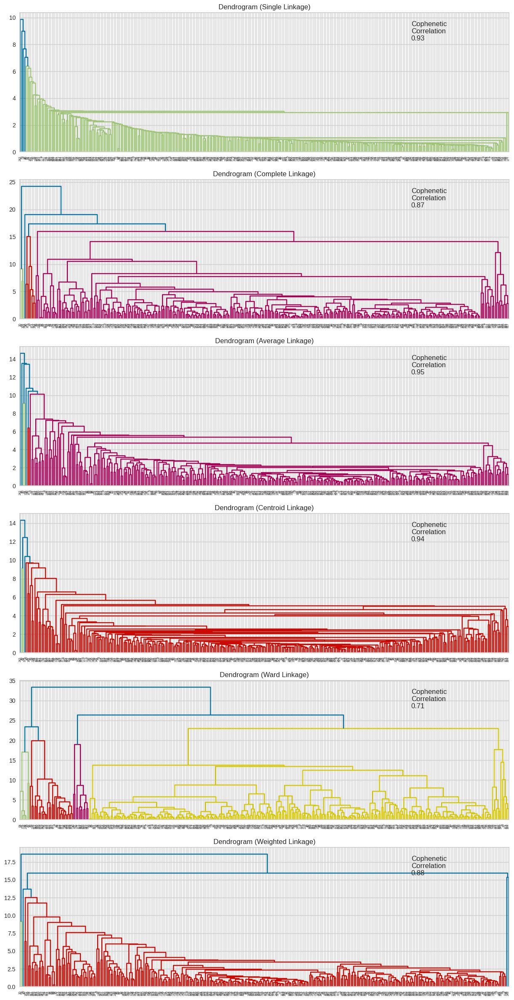

In [138]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]
compare = []

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(hc_df, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(hc_df))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

    compare.append([method, coph_corr])

The cophenetic correlation is highest for average and centroid linkage methods.
We will move ahead with average linkage.
3 appears to be the appropriate number of clusters from the dendrogram for average linkage.

In [ ]:
# create and print a dataframe to compare cophenetic correlations for different linkage methods
df_cc = pd.DataFrame(compare, columns=compare_cols)
df_cc = df_cc.sort_values(by="Cophenetic Coefficient")
df_cc

,Linkage,Cophenetic Coefficient
4,ward,0.706914
1,complete,0.868928
5,weighted,0.878350
0,single,0.925626
3,centroid,0.943701
2,average,0.950756


The average linkage has the highest Cophenetic coefficient of 0.951

### Creating model using sklearn

In [139]:
## Complete the code to define the hierarchical clustering model
HCmodel = AgglomerativeClustering(n_clusters=5, affinity="euclidean", linkage="average")
HCmodel.fit(hc_df)

AgglomerativeClustering(affinity='euclidean', linkage='average', n_clusters=5)

In [140]:
# creating a copy of the original data
df2 = data1.copy()

# adding hierarchical cluster labels to the original and scaled dataframes
hc_df["HC_segments"] = HCmodel.labels_
df2["HC_segments"] = HCmodel.labels_

new variables HC_segments, have been added to the original and scaled dataframes

### Cluster Profiling¶

In [142]:
 ## to groupby the cluster labels
 hc_cluster_profile = hc_df.groupby("K_means_segments").mean()

In [155]:
 ## to groupby the cluster labels and ROE
hc_cluster_profile["count_in_each_segments"] = (
    hc_df.groupby("K_means_segments")["current_price"].count().values
)

In [156]:
# to show dataframe with maximum values for each metric highlighted
hc_cluster_profile.style.highlight_max(color="lightblue", axis=0)

,current_price,price_change,volatility,roe,cash_ratio,net_cash_flow,net_income,earnings_per_share,estimated_shares_outstanding,p/e_ratio,p/b_ratio,HC_segments,count_in_each_segments
K_means_segments,,,,,,,,,,,,,
0,0.034604,0.126536,-0.209602,-0.056535,-0.035529,-0.023049,-0.011384,0.171125,-0.178392,-0.185093,-0.021006,0.010239,293
1,-0.293323,0.225363,-0.593683,-0.139559,0.776616,0.362618,3.018134,0.150899,3.861986,-0.270027,-0.129856,0.285714,14
2,-0.182803,-1.219091,2.112878,0.561171,-0.014021,0.050810,-1.179347,-1.583402,-0.054513,1.757959,0.241601,0.121212,33


maximum values for each variable in every cluster segment is highlighted in color

In [148]:
# checking for the names of the countries in each cluster
for cl in hc_df["K_means_segments"].unique():
    print(
        "The",
        hc_df[hc_df["K_means_segments"] == cl]["cash_ratio"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(hc_df[hc_df["K_means_segments"] == cl]["cash_ratio"].unique())
    print("-" * 100, "\n")

The 110 countries in cluster 0 are:
[-2.10697706e-01  7.72688556e-02 -3.34875142e-02  1.21805946e+00
 -2.32848980e-01 -4.98664267e-01 -6.20496274e-01 -6.75874459e-01
  3.20932869e-01 -2.55000254e-01  1.71646313e+00 -6.31571911e-01
  4.40419447e-02 -2.77151528e-01  6.75353253e-01 -3.65756624e-01
  3.23382540e+00 -3.43605350e-01 -7.64479555e-01 -2.60603223e-04
  1.16268128e+00  1.02977364e+00 -7.31252644e-01 -5.09739904e-01
  6.42126342e-01  1.32647041e-01  6.97504527e-01 -6.64798822e-01
 -1.88546432e-01 -6.42647548e-01 -3.76832261e-01 -5.54042452e-01
  2.91263192e+00 -3.54680987e-01 -7.75555192e-01 -4.76512993e-01
  1.84937077e+00 -2.43924617e-01 -2.99302802e-01 -7.42328281e-01
  1.24021074e+00 -1.99622069e-01 -6.53723185e-01 -6.86950096e-01
 -4.32210445e-01 -1.11016973e-01 -5.31891178e-01 -4.87588630e-01
 -1.33168247e-01  9.94201296e-02  2.22594243e+00 -7.53403918e-01
 -6.09420637e-01  1.04084927e+00 -2.88227165e-01  2.07088351e+00
  2.65554684e-01 -4.54361719e-01 -3.87907898e-01 -5.76

The maximum cash ratio values for each numeric variable per cluster is indicated

In [157]:
# checking for the names of the countries in each cluster
for cl in data1["K_means_segments"].unique():
    print(
        "The",
        data1[data1["K_means_segments"] == cl]["current_price"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(data1[data1["K_means_segments"] == cl]["gics_sector"].unique())
    print("-" * 100, "\n")

The 292 countries in cluster 0 are:
['Industrials' 'Health Care' 'Information Technology' 'Consumer Staples'
 'Utilities' 'Financials' 'Real Estate' 'Materials'
 'Consumer Discretionary' 'Telecommunications Services' 'Energy']
---------------------------------------------------------------------------------------------------- 

The 33 countries in cluster 2 are:
['Information Technology' 'Health Care' 'Consumer Discretionary' 'Energy'
 'Materials' 'Industrials']
---------------------------------------------------------------------------------------------------- 

The 14 countries in cluster 1 are:
['Financials' 'Consumer Discretionary' 'Information Technology'
 'Health Care' 'Consumer Staples' 'Telecommunications Services' 'Energy']
---------------------------------------------------------------------------------------------------- 



In [160]:
# to check the names of the sub industries in each cluster
for cl in data1["K_means_segments"].unique():
    print("In cluster {}, the following sub industries are present:".format(cl))
    print(data1[data1["K_means_segments"] == cl]["gics_sub_industry"].unique())
    print()

In cluster 0, the following sub industries are present:
['Airlines' 'Pharmaceuticals' 'Health Care Equipment'
 'Application Software' 'Agricultural Products'
 'Data Processing & Outsourced Services' 'MultiUtilities'
 'Electric Utilities' 'Life & Health Insurance'
 'Property & Casualty Insurance' 'REITs' 'Multi-line Insurance'
 'Insurance Brokers' 'Internet Software & Services' 'Specialty Chemicals'
 'Building Products' 'Semiconductor Equipment'
 'Electrical Components & Equipment' 'Asset Management & Custody Banks'
 'Biotechnology' 'Specialized REITs' 'Specialty Stores'
 'Managed Health Care' 'Electronic Components' 'Aerospace & Defense'
 'Home Entertainment Software' 'Residential REITs' 'Semiconductors'
 'Water Utilities' 'Consumer Finance' 'Banks' 'Metal & Glass Containers'
 'Health Care Distributors' 'Auto Parts & Equipment'
 'Construction & Farm Machinery & Heavy Trucks' 'Real Estate Services'
 'Hotels, Resorts & Cruise Lines' 'Fertilizers & Agricultural Chemicals'
 'Regional Banks

The names of each sub industry for every are is indicated

In [162]:
# to check the names of the Companies in each cluster
for cl in data1["K_means_segments"].unique():
    print("In cluster {}, the following companies are present:".format(cl))
    print(data1[data1["K_means_segments"] == cl]["security"].unique())
    print()

In cluster 0, the following companies are present:
['American Airlines Group' 'AbbVie' 'Abbott Laboratories'
 'Adobe Systems Inc' 'Archer-Daniels-Midland Co' 'Alliance Data Systems'
 'Ameren Corp' 'American Electric Power' 'AFLAC Inc'
 'American International Group, Inc.' 'Apartment Investment & Mgmt'
 'Assurant Inc' 'Arthur J. Gallagher & Co.' 'Akamai Technologies Inc'
 'Albemarle Corp' 'Alaska Air Group Inc' 'Allstate Corp' 'Allegion'
 'Applied Materials Inc' 'AMETEK Inc' 'Affiliated Managers Group Inc'
 'Amgen Inc' 'Ameriprise Financial' 'American Tower Corp A'
 'AutoNation Inc' 'Anthem Inc.' 'Aon plc' 'Amphenol Corp' 'Arconic Inc'
 'Activision Blizzard' 'AvalonBay Communities, Inc.' 'Broadcom'
 'American Water Works Company Inc' 'American Express Co' 'Boeing Company'
 'Baxter International Inc.' 'BB&T Corporation' 'Bard (C.R.) Inc.'
 'BIOGEN IDEC Inc.' 'The Bank of New York Mellon Corp.' 'Ball Corp'
 'Bristol-Myers Squibb' 'Boston Scientific' 'BorgWarner'
 'Boston Properties' 'Cate

Names of companies in each cluster are indicated

In [168]:
data1.groupby(["K_means_segments", "gics_sector"])['security'].count()

K_means_segments  gics_sector                
0                 Consumer Discretionary         37
                  Consumer Staples               18
                  Energy                          5
                  Financials                     45
                  Health Care                    36
                  Industrials                    52
                  Information Technology         27
                  Materials                      19
                  Real Estate                    27
                  Telecommunications Services     3
                  Utilities                      24
1                 Consumer Discretionary          1
                  Consumer Staples                1
                  Energy                          1
                  Financials                      4
                  Health Care                     3
                  Information Technology          2
                  Telecommunications Services     2
2                 

The number of companies in each type of Gics sector per cluster is indicated. Cluster 0 had the most number of entities while cluster 2 had the least

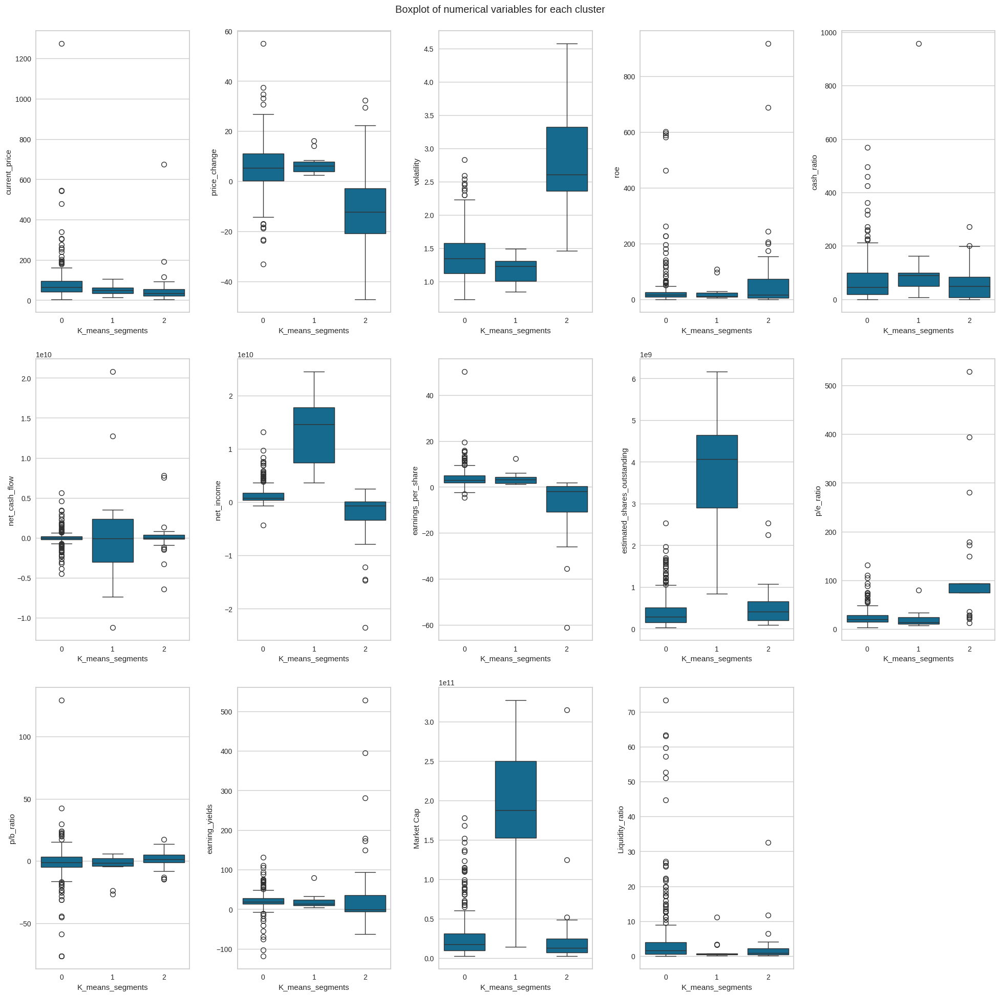

In [173]:
plt.figure(figsize=(20, 20))
plt.suptitle("Boxplot of numerical variables for each cluster")

for i, variable in enumerate(num_col):
    plt.subplot(3, 5, i + 1)
    sns.boxplot(data=data1, x="K_means_segments", y=variable)

plt.tight_layout(pad=2.0)

The box plots of clusters according to original data variables.
Cluster 0
High current price with many outliers. High price changes with highest price change value ranges. Negative and positive outlier values in price change values. Volatility medium with many high value outliers The ROE very low but with high positive outlier values. Lowest cash ratio but high value range and high number of outliers. Low net cash flow, low range but with very dense positive and negative outlier values. Net income medium with low value range and many high outliers. EPS low with very many positive and negative outlier values with medium value ranges. Lowest estimated shares outstanding with many positive outlier values. Low P/E ratio with many high value outliers. P/B ratio low with very many positive and negative outliers. Low market cap with very many high value ouliers. Low liquidity ratio but with highest value range and very many positive outlier values.

Cluster 1
Medium current price. Price change value range low with few positive outliers. Lowest volatility with small value ranges. Low ROE with few positive outliers and lowest ROE range. Highest cash ratio with no outliers. Low net cash flow with highest range. High net income with high range in values and no outliers. The EPS value range is low, EPS is low with few positive outliers. High ESO with high value range. Low P/E ratio. Low P/B ratio with negative outliers. Very low earnings yield and low value range. High market cap with high value range and no outlier values. Low liquidity ratio.

Cluster 2
Lowest current price and price change. Price change has few positive outliers. High volatility with high value range. High ROE with highest value range. medium cash ratio with few outliers. Low net cash flow with lowrange of values and both positive and negative outlier values. Low net income. Low EPS with high value range and few negative outlier values. Low ESO with few positive outlier values. High P/E ratio with many negative outlier values. Low P/B ratio. Low median earnings yield but with high value range. Low market cap with few outliers. Low liquidity ratio.

In [170]:
# to display cluster profiles
cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,current_price,price_change,volatility,roe,cash_ratio,net_cash_flow,net_income,earnings_per_share,estimated_shares_outstanding,p/e_ratio,p/b_ratio,count_in_each_segments
K_means_segments,,,,,,,,,,,,
0,0.034604,0.126536,-0.209602,-0.056535,-0.035529,-0.023049,-0.011384,0.171125,-0.178392,-0.185093,-0.021006,293
1,-0.293323,0.225363,-0.593683,-0.139559,0.776616,0.362618,3.018134,0.150899,3.861986,-0.270027,-0.129856,14
2,-0.182803,-1.219091,2.112878,0.561171,-0.014021,0.050810,-1.179347,-1.583402,-0.054513,1.757959,0.241601,33


Cluster profiles according to maximum values of scaled variables is indicated

### Which clustering technique took less time for execution?

I used google colab so none of the methods took considerable amount of time to run. However running the dendograms took slightly more time comapred to k-means.

### Which clustering technique gave you more distinct clusters, or are they the same?

Each technique gave 3 clusters

### How many observations are there in the similar clusters of both algorithms?

In K-means the following was observed: Cluster 0= 293; cluster 1= 14; and cluster 2 = 33

In hierarchical clustering: Cluster Cluster 0= 293; cluster 1= 14; and cluster 2 = 33

### How many clusters are obtained as the appropriate number of clusters from both algorithms?

I generated 3 clusters using K-means and hierachical clustering algorithims

### Differences or similarities you obtained in the cluster profiles from both the clustering techniques.

- The number of entities obtained in each cluster varied significantly.
- although cluster 0 in each method consisted of the highest number of entities, K means cluster had similar number entities compared to hierarchical clustering.
-

## Actionable Insights and Recommendations

Cluster 0
- Liquidity management:
Optimize cash position: Given the low liquidity ratio, focus on maintaining an adequate cash reserve. Regularly assess working capital needs and adjust cash holdings accordingly.
Emergency fund: Establish an emergency fund to cover unexpected expenses or short-term liquidity gaps.
- Profitability enhancement:
ROE improvement: Analyze the factors contributing to the low ROE. Consider operational efficiency, cost reduction, and revenue growth strategies.
Benchmark against industry peers to identify areas for improvement.
Leverage positive outliers: Study successful cases within the cluster. What strategies led to high net income and positive outliers and apply similar approaches.
- Investment opportunities:
Stock selection: Identify companies with strong fundamentals and growth potential.
Diversify investments across sectors to mitigate risk.
Explore high outliers: Investigate companies with exceptional performance metrics (e.g., EPS, P/E ratio). Learn from their success stories.
- Valuation metrics:
P/B ratio analysis: Understand why the P/B ratio is low. Is it due to undervaluation or specific market conditions? Consider adjusting valuation methods or reassessing asset values.
- Risk mitigation:
Volatility management: Monitor price changes closely. Implement risk controls such as stop-loss orders. Hedge against extreme price swings using derivatives if necessary.
- Capital structure optimization:
Share buybacks: If feasible, consider share buybacks to enhance shareholder value. Evaluate the impact on EPS and overall capital structure.
- Debt-equity mix: Assess the optimal debt-equity ratio. Balance risk and financial stability.

Cluster 1

- Medium current price:
Market positioning: Assess whether the current price aligns with the company’s market positioning. Consider competitive pricing strategies and market trends.
- Low volatility with Small Value Ranges:
Risk management: While low volatility is generally favorable, ensure that it doesn’t hinder growth opportunities. Evaluate risk tolerance and diversification.
- Low ROE with few positive outliers:
Operational efficiency: Investigate factors contributing to low ROE. Optimize operational processes, cost management, and resource allocation.
Learn from outliers: Study companies with positive ROE outliers. Identify successful practices.
- Highest cash ratio with no outliers:
Liquidity management: Maintain the strong cash position for financial stability. Explore investment opportunities while preserving liquidity.
- Low net cash flow with highest range:
Cash flow optimization: Analyze cash flow patterns. Address consistent negative trends. Consider working capital adjustments and investment decisions.
- High net income with no outliers:
Profitability strategies: Understand the sources of high net income.
Leverage this strength to invest in growth initiatives.
- Low EPS with few positive outliers:
Earnings improvement: Explore ways to boost earnings per share.
Learn from companies with positive EPS outliers.
- High ESO with high value range:
Equity compensation management: Evaluate employee stock options (ESO) impact on dilution. Balance ESO issuance with shareholder interests.
- Low P/E Ratio:
Valuation assessment: Understand why the P/E ratio is low. Is it undervaluation or specific market conditions? Consider investor sentiment and growth prospects.
- Low P/B ratio with negative outliers:
Book value analysis: Investigate the book value relative to market price. Address any underlying issues affecting valuation.
- Very low earnings yield with low value range:
Investor perception: Communicate the company’s growth potential and long-term value. Highlight positive aspects beyond earnings yield.
- High market cap with no outliers:
Market leadership: Capitalize on the strong market cap to attract investors. Reinforce the company’s competitive advantages.
- Low liquidity ratio:
Liquidity enhancement: Balance liquidity needs with growth objectives.
Explore short-term financing options if necessary.

Cluster 2
- Customer segmentation and clustering:
Understanding customer segmentation: Customer segmentation involves dividing your customer base into distinct groups based on shared characteristics or behaviors. These groups represent unique subgroups within your overall customer population. Clustering analysis, a sophisticated machine learning technique, plays a pivotal role in identifying natural groupings within customer data1.
- Lowest current price and price change:
Market positioning: Assess whether the low current price aligns with the company’s market positioning. Consider targeted marketing efforts to attract price-sensitive customers.
- High volatility with wide value range:
Risk management: Monitor price fluctuations closely. Implement risk controls to mitigate extreme volatility.
Explore hedging strategies to protect against adverse market movements.
- High ROE with highest value range:
Leverage strengths: Capitalize on the high ROE. Identify successful practices within the cluster. Communicate the company’s financial health to investors and stakeholders.
- Medium cash ratio with few outliers:
Optimize cash management: Maintain a balanced cash position. Avoid excessive liquidity or cash shortages. Explore investment opportunities while preserving financial stability.
- Low net cash flow with both positive and negative outliers:
Cash flow analysis: Evaluate cash flow patterns. Address consistent negative trends. Leverage positive outliers to identify successful cash flow strategies.
- Low net income:
Profitability Enhancement: Investigate factors contributing to low net income. Focus on cost reduction and revenue growth.
Benchmark against industry peers to identify improvement areas.
- Low EPS with high value range and few negative outliers:
Earnings per share improvement: Explore strategies to boost EPS. Consider operational efficiency and pricing adjustments. Learn from companies with positive EPS outliers.
- Low ESO with few positive outliers:
Equity compensation management: Evaluate employee stock options (ESO) impact on dilution. Balance ESO issuance with shareholder interests.
- High P/E ratio with many negative outliers:
Valuation assessment: Understand why the P/E ratio is high. Is it due to growth expectations or market sentiment? Consider communicating the company’s growth prospects to investors.
- Low P/B Ratio:
Book value analysis: Investigate the book value relative to market price. Address any underlying issues affecting valuation.
- Low median earnings yield with high value range:
Investor perception: Highlight other strengths beyond earnings yield.
Communicate long-term value and growth potential.
- Low market cap with few outliers:
Market positioning: Position the company as an undervalued opportunity.
Explore targeted marketing to attract investors.
- Low liquidity ratio:
Liquidity enhancement: Balance liquidity needs with growth objectives.
Explore short-term financing options if necessary.